# Audio CNN

## Introduction

This is a personal project designed to explore the **ESC-50** dataset and take a look at the implementation of the most popular convolutional neural network archeitures, **ResNet** and take a look at audio form augmentation techniques

## About The Dataset

The Dataset contains 2000 samples of 50 evenly split classes of environmental audio recordings (40 samples per class), with each recording is 5 seconds long

For access to the dataset, you can clone this git repo [here](https://github.com/karolpiczak/ESC-50)


| Animals | Natural soundscapes & water sounds | Human, non-speech sounds | Interior/domestic sounds | Exterior/urban noises |
|---|---|---|---|---|
| Dog | Rain | Crying baby | Door knock | Helicopter |
| Rooster | Sea waves | Sneezing | Mouse click | Chainsaw |
| Pig | Crackling fire | Sneezing | Keyboard typing | Siren |
| Cow | Crickets | Clapping | Door, wood creaks | Car horn |
| Frog | Chirping birds | Coughing | Can opening | Engine |
| Cat | Water drops | Footsteps | Washing machine | Train |
| Hen | Wind | Laughing | Vacuum cleaner | Church bells |
| Insects (flying) | Pouring water | Brushing teeth | Clock alarm | Airplane |
| Sheep | Toilet flush | Snoring | Clock tick | Fireworks |
| Crow | Thunderstorm | Drinking, sipping | Glass breaking | Hand saw |




### References

https://medium.com/analytics-vidhya/understanding-the-mel-spectrogram-fca2afa2ce53

https://medium.com/@davidfagb/guide-to-transfer-learning-in-deep-learning-1f685db1fc94

https://superkogito.github.io/blog/2020/01/25/signal_framing.html

In [1]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [2]:
!pip install panns_inference;
!pip install torchcodec;

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 38.7 MB/s eta 0:00:00


In [ ]:
# Clone repo to environment
!git clone https://github.com/karoldvl/ESC-50.git "/content/gdrive/MyDrive/Colab_Notebooks/PyTorch_For_Beginners/projects/Audio-CNN/ESC-50"

In [3]:
# Move Directory
%cd /content/gdrive/MyDrive/Colab_Notebooks/PyTorch_For_Beginners/projects/Audio-CNN/

/content/gdrive/MyDrive/Colab_Notebooks/PyTorch_For_Beginners/projects/Audio-CNN


In [4]:
 # --- PyTorch Libraries ---
import torch
import torchvision
import torchvision.datasets as datasets
import torch.nn.functional as F
import torch.nn as nn
import torchaudio
import torchcodec
from torch.utils.data import DataLoader
from torch.utils.data.dataset import Dataset
import torchvision.transforms as transforms
import torchaudio.transforms as T
import torchvision.models as models
from torch.optim.lr_scheduler import OneCycleLR

# --- Visualization Libraries ---
import matplotlib.pyplot as plt
import seaborn as sns

# --- Math Libraries ---
import numpy as np
import pandas as pd
import math
import random

# --- ML Libraries ---
from sklearn.model_selection import train_test_split
from tqdm.notebook import trange, tqdm
import librosa
from librosa.feature import melspectrogram
from sklearn.metrics import confusion_matrix, classification_report
from scipy.signal import butter, filtfilt
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler

# --- Image Handling Libraries ---
from PIL import Image
from pathlib import Path


# --- Misc Libraries
import os
import glob
import time
from IPython.display import Audio, display
import soundfile as sf
import warnings
warnings.filterwarnings('ignore')


# --- PyTorch Settings
torch.manual_seed(42)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [ ]:
# --- Load audio files into dataframe ---
df = pd.read_csv('ESC-50/meta/esc50.csv')
df = df.drop(['esc10','src_file','take'],axis = 1) # Drop unused features
audio_path = 'ESC-50/audio/'
df['filename'] = audio_path + df['filename']
df.head()

,filename,fold,target,category
0,ESC-50/audio/1-100032-A-0.wav,1,0,dog
1,ESC-50/audio/1-100038-A-14.wav,1,14,chirping_birds
2,ESC-50/audio/1-100210-A-36.wav,1,36,vacuum_cleaner
3,ESC-50/audio/1-100210-B-36.wav,1,36,vacuum_cleaner
4,ESC-50/audio/1-101296-A-19.wav,1,19,thunderstorm


## Exploratory Data Analysis

In [ ]:
# --- Examining The Dataset ---
print(f'Shape of Data Frame: {df.shape}')
print(f'{df.info()}\n')
df.describe()

Shape of Data Frame: (2000, 4)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  2000 non-null   object
 1   fold      2000 non-null   int64 
 2   target    2000 non-null   int64 
 3   category  2000 non-null   object
dtypes: int64(2), object(2)
memory usage: 62.6+ KB
None



,fold,target
count,2000.000000,2000.000000
mean,3.000000,24.500000
std,1.414567,14.434479
min,1.000000,0.000000
25%,2.000000,12.000000
50%,3.000000,24.500000
75%,4.000000,37.000000
max,5.000000,49.000000


Text(0.5, 1.0, 'Distribution of Classes')

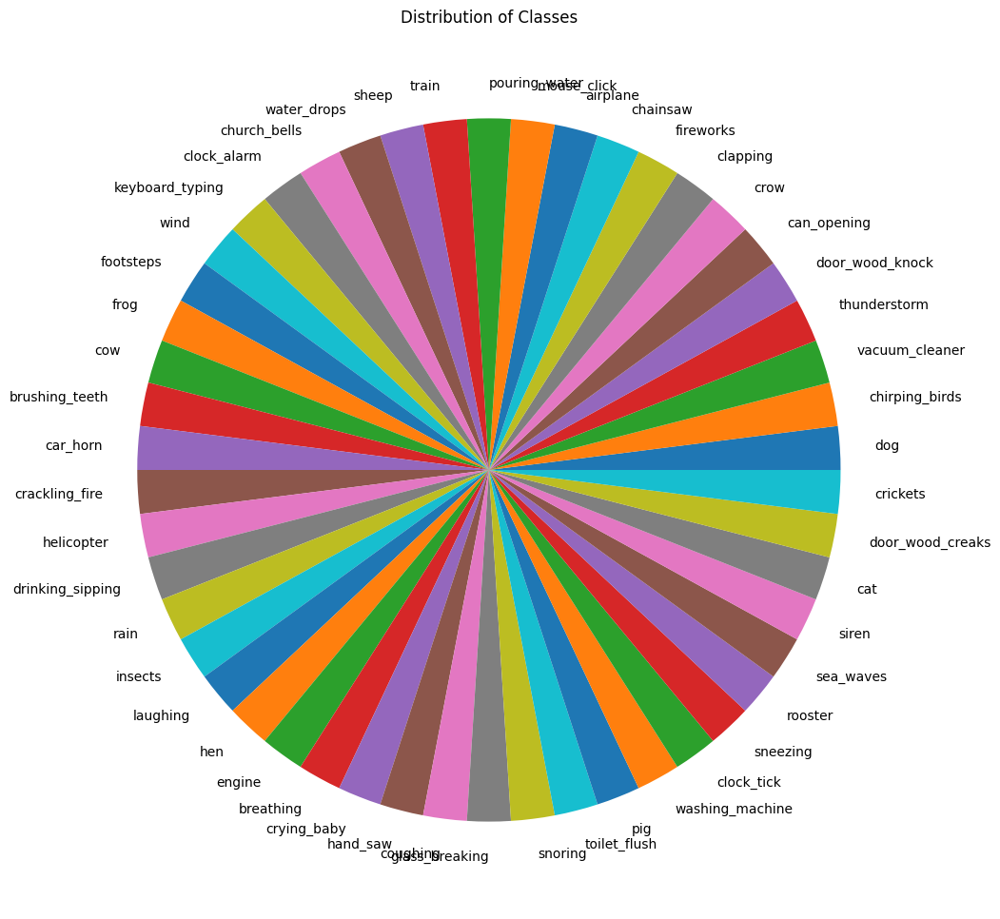

In [ ]:
# --- Assess Distribution of Classes ---
plt.figure(figsize=(14,12))
_ = plt.pie(df['category'].value_counts(),labels=df['category'].unique())
plt.title('Distribution of Classes')

So as we can see from the pie plot, we have an even class distribution amongst the 50 classes.

In [ ]:
# --- Loading .wav audio files ---
sample_path, sample_label = df['filename'][0],df['category'][0] # Access first file

print(f'Sound: {sample_label}\n')
Audio(filename=sample_path,autoplay = False) # play back of audio file


Sound: dog



In [ ]:
# --- Visualzing .wav File ---
y, sr = librosa.load(sample_path) # Load the audio time series and sample rate of the data
# Returns y -> Numpy array of floating point values (waveform)
# Returns sr -> samples/second

print(f'Waveform: {y.shape}')
print(f'Sample Rate: {sr}')

Waveform: (110250,)
Sample Rate: 22050


### What is the Wabeform

The waveform is what the sound amplitue over time

Note in librosa, when we get the waveform it is already normalized for us

### What is Sample Rate?

The sample rate defines **how many times per second a sound is sampled**. Its measured in Hertz per second.

When loading audio files in librosa, the default sample rate for all auidos is 22,050 Hz

A lower sample rate essentially means we are working with less data.

Lets compare this to torchaudio file loading

In [ ]:
y_torch,sr_torch = torchaudio.load(sample_path)

print(f'Time Series Audio: {y_torch.shape}')
print(f'Sample Rate: {sr_torch}')

Time Series Audio: torch.Size([1, 220500])
Sample Rate: 44100


So as we can see for the same sample, the sample rate is double. This is because PyTorch has no default limitation applied to the sample rate.

However there are trades off for this, working in 44.1 kHz means we are doubling the computation costs.

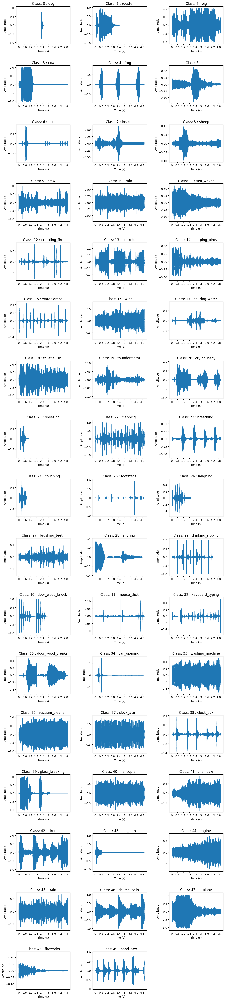

In [ ]:
# --- Visualize Audio Signals of all 50 Classes ---
df_unique = df.drop_duplicates(subset=['target']).sort_values(by='target').reset_index(drop=True)
n = len(df_unique)
rows = (n // 3) + 1
plt.figure(figsize=(12, rows * 3))

for i in range(n):
    audio_path = df_unique['filename'][i]
    y, sr = librosa.load(audio_path)

    plt.subplot(rows, 3, i + 1)
    librosa.display.waveshow(y=y, sr=sr)
    plt.title(f"Class: {df_unique['target'][i]} : {df_unique['category'][i]}")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")

plt.tight_layout(pad=3.0)
plt.show()



## Fourier Transform and Mel Spectrograms

So right now all we have is audio signals, so this begs the question, **how do we use this to train a CNN?**

Audio signals alone are not enough to extract and useful information, but we can transform this into a medium that can be useful for modelling. This medium is called a ** Spectrogram** and the transformation is done using a **Fourier Transform**


### Fourier Transform

A fourier transform is a method by which we can "convert a signal from the time domain into the frequency domain" (Roberts, 2020)

Basically what a fourier transform approximates a given signal to different sine and cosine waves.
- Think of it like this, imagine you are listening to a piano chord being played,
- to our ears it sounds like one combined and contious noise
- But in reailty, its several notes (frequencies) being played together
- The fourier transform is like a tool that can tell us which piano keys are being pressed and how loud each one is


There are a few different types of fourier transform, but for audio processing the **Short-time Fourier Transform (STFT)** is often used.

The STFT breaks signals into short frequenceys, then applies the **Discrete Fourier Transform (DFT)**. Thus providing a time-frequnecy represnetation of the signal.

With the ESC-50 dataset in mind, the STFT of the audio signals will provide is cruical information. The most important of which is the ability to construct a **Spectrogram**

### Spectrograms and Mel Spectrograms

A spectrogram is a grpahical representation of the time-frequency relationship of a signal.

However one important objection to consider is, the human cabability of percieving frequencies.

Studies how that humans are "better at detecting differences in lower frequencies than higher frequencies. For example, we can easily tell the difference between 500 and 1000 Hz, but we will hardly be able to tell a difference between 10,000 and 10,500 Hz, even though the distance between the two pairs are the same." (Robert,2020)

The solution to this issue comes in the form the the **Mel Scale**

The Mel Scale is based on the principle that humans cannot percieve frequencies on a linear scale, so what a mel scale does is it takes the **logarithmic** of the spectorgram, thereby creating the **Mel Spectrogram**

With audio now formatted in the Mel Spectrogram we have a scale that focues on patterns more meaningful for humans rather than raw frequency outputs.


With all this out the way, lets take our audio signals and convert them to mel spectrograms.
- Luckily for us we can omit alot of the work and just use PyTorch :)

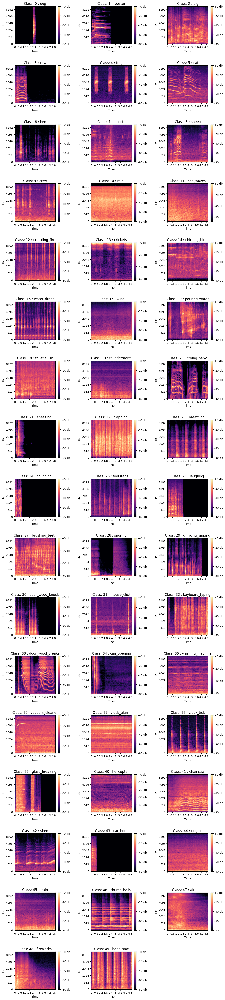

In [ ]:
# --- Mel Spectrogram Visual of 50 Classes ---

df_unique = df.drop_duplicates(subset=['target']).sort_values(by='target').reset_index(drop=True)
n = len(df_unique)
rows = (n // 3) + 1
plt.figure(figsize=(12, rows * 3))

for i in range(n):
    audio_path = df_unique['filename'][i]
    y, sr = librosa.load(audio_path)

    # n_fft: Number of audio samples in the Fourier window (↑ n_ffts: better frequency, worse time resolution, ↓ worse frequency, better time resolution)
    # hop_length: The number of samples to shift the window for next FFT
    # n_mels: numbers of mel frequency bands to divide the frequency axis
    mel = melspectrogram(y=y,sr=sr,n_fft=2048,hop_length=512,n_mels=128) # Returns a numpy array of (number of mel frequency bands, time frames)

    mel_db = librosa.power_to_db(mel,ref=np.max) # Covert To Log Scale

    plt.subplot(rows, 3, i + 1)
    librosa.display.specshow(mel_db,x_axis='time',y_axis='mel',sr=sr)
    plt.colorbar(format='%+2.0f db')
    plt.title(f"Class: {df_unique['target'][i]} : {df_unique['category'][i]}")

plt.tight_layout(pad=3.0)
plt.show()

### Waveform Data Augmentation

We can apply data augmentations to the dataset to artifically increase the number of training samples in the dataset.

This will help the model by allowing it to have more training data to better generalize to new unseen data.


With respect to audio some techniques we can use to apply to audio is the following

1. Time stretching: Modifies the duration of the audio clip without changing its pitch. Meaning it just speeds up or slows down the audio
    - This will help the CNN recognize the same audio at varying speeds


2. Time shifting: Slides the audio forward or backward in time. So the sound could appear earlier or later in the file.

3. Pitch Shifting: Changes the pitch up or down in the audio. This changes the intesity of the frequency in the mel spectorgram

In [ ]:
# --- Test Sample ---
test_audio,test_label = df['filename'][0],df['category'][0]
y,sr = librosa.load(test_audio)
mel = melspectrogram(y=y,sr=sr,n_fft=2048,hop_length=512,n_mels=128) # Returns a numpy array of (number of mel frequency bands, time frames)
mel_db = librosa.power_to_db(mel,ref=np.max) # Covert To Log Scale



ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/tmp/ipython-input-2674943073.py", line 3, in <cell line: 0>
    y,sr = librosa.load(test_audio)
           ^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/librosa/core/audio.py", line 170, in load
    if isinstance(path, tuple(audioread.available_backends())):
                              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/audioread/__init__.py", line 88, in available_backends
    if _gst_available():
       ^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/audioread/__init__.py", line 27, in _gst_available
    import gi
  File "<frozen importlib._bootstrap>", line 1360, in _find_and_load
  File "<frozen importlib._bootstrap>", line 1322, in _find_and_load_unlocked
  File "<frozen importlib._bootstrap>

In [ ]:
def plot_MelSpectrogram_vs_Augmented(aug_db,label=test_label, clean_db = mel_db,title = f'Mel Spectrogram (Augmented)'):
  plt.figure(figsize=(12, 5))

  # --- Clean audio ---
  plt.subplot(1, 2, 1)
  librosa.display.specshow(mel_db, sr=sr, x_axis='time', y_axis='mel')
  plt.colorbar(format='%+2.0f dB')
  plt.title(f'Mel Spectrogram (Clean): {test_label}')

  # --- Augmented audio ---
  plt.subplot(1, 2, 2)
  librosa.display.specshow(aug_db, sr=sr, x_axis='time', y_axis='mel')
  plt.colorbar(format='%+2.0f dB')
  plt.title(title + ": " + label)

  plt.tight_layout()
  plt.show()


In [ ]:
# --- Time Stretching Audio Signal ---

"""
  Time Stretching involves changing the speed of the audio
"""
def time_stretch(y,rate = None):
  if rate is None:
    rate = random.uniform(0.75,1.35)
  return librosa.effects.time_stretch(y,rate=rate)

y_stretched = time_stretch(y)
mel_stretched = melspectrogram(y=y_stretched,sr=sr,n_fft=2048,hop_length=512,n_mels=128) # Returns a numpy array of (number of mel frequency bands, time frames)
mel_db_stretched = librosa.power_to_db(mel_stretched,ref=np.max) # Covert To Log Scale

print(f'Category (Stretched): {test_label}\n') # Print the associated class
Audio(y_stretched,rate=sr,autoplay=False) # Play noisy audio

Category (Stretched): dog



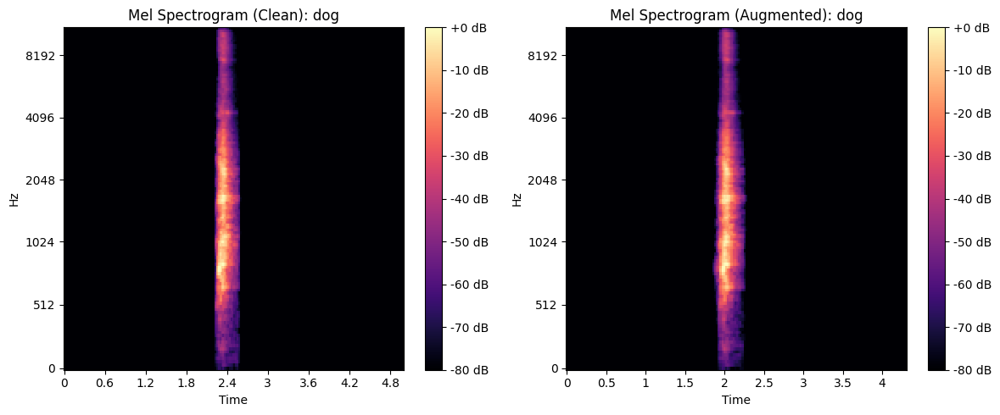

In [ ]:
# --- Visualizing Stretched (Mel Spectrogram) ---
plot_MelSpectrogram_vs_Augmented(mel_db_stretched)

In [ ]:
# --- Time Shifting Audio Signal ---

"""
Time shifting involves moving the audio signal forward or back in time. This will help in giving the model more data to be trained on
"""

def time_shift(y,scale = None):
  if scale is None:
    scale = random.uniform(0.1,0.4) # Up to 40% shift
  shift = np.random.randint(-int(scale * len(y)), int(scale * len(y))) # forward or backward shift
  y_shifted = np.roll(y, shift)
  if shift > 0:
    y_shifted[:shift] = 0
  elif shift < 0:
    y_shifted[shift:] = 0
  return y_shifted



y_shifted = time_shift(y)
mel_shifted = melspectrogram(y=y_shifted,sr=sr,n_fft=2048,hop_length=512,n_mels=128) # Returns a numpy array of (number of mel frequency bands, time frames)
mel_db_shifted = librosa.power_to_db(mel_shifted,ref=np.max) # Covert To Log Scale

print(f'Category (Shifted): {test_label}\n') # Print the associated class
Audio(y_shifted,rate=sr,autoplay=False) # Play noisy audio

Category (Shifted): dog



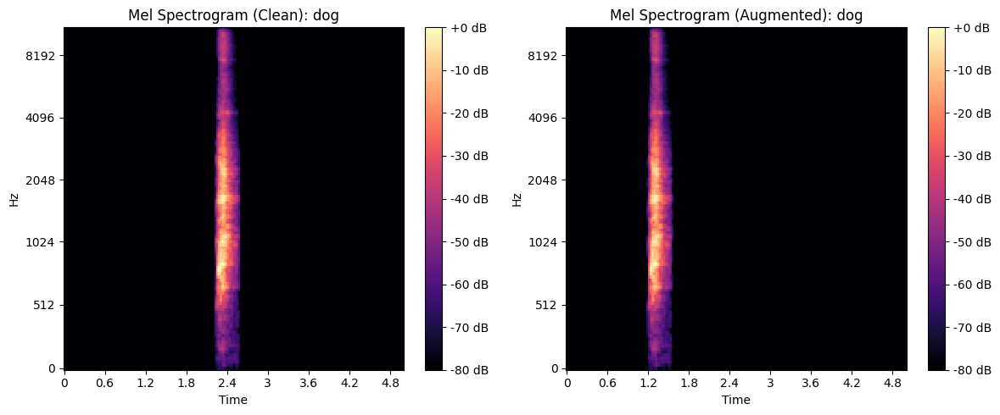

In [ ]:
# --- Visualizing Shifted Audio (Mel Spectrogram) ---
plot_MelSpectrogram_vs_Augmented(mel_db_shifted)

In [ ]:
# --- Pitch Shift ---

def shift_pitch(y,sr,n_steps=None):
  """
  Takes audio and changes the frequency of the waveform
  """
  if n_steps is None:
    n_steps = random.randint(-1,1)
  return librosa.effects.pitch_shift(y=y,sr=sr,n_steps=n_steps)

y_pitch_shift = shift_pitch(y=y,sr=sr)
mel_pitch_shifted = melspectrogram(y=y_pitch_shift,sr=sr,n_fft=2048,hop_length=512,n_mels=128) # Returns a numpy array of (number of mel frequency bands, time frames)
mel_db_pitch_shifted= librosa.power_to_db(mel_pitch_shifted,ref=np.max) # Covert To Log Scale

print(f'Category (Pitch Shifted): {test_label}\n') # Print the associated class
Audio(y_pitch_shift,rate=sr,autoplay=False) # Play noisy audio

Category (Pitch Shifted): dog



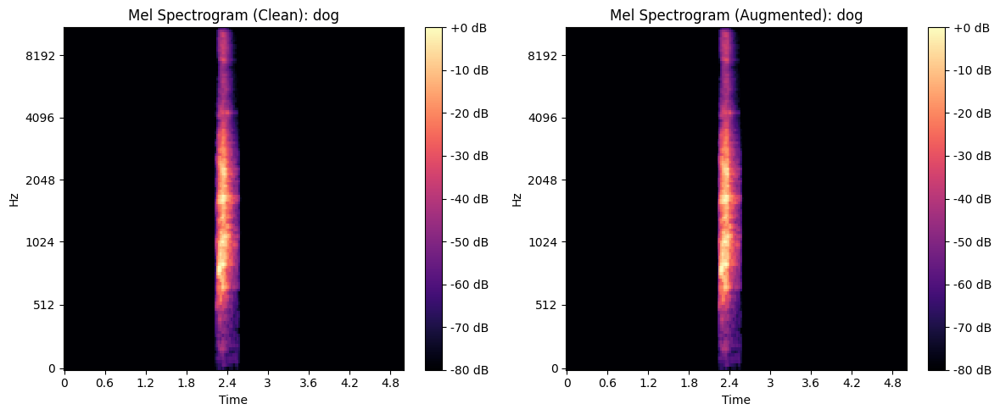

In [ ]:
# --- Visualizing Pitch Shifted (Mel Spectrogram) ---
plot_MelSpectrogram_vs_Augmented(mel_db_pitch_shifted)

In [ ]:
# --- Volume Change ---
def change_volume(y,factor = None):
  if factor is None:
    factor = random.uniform(0.5,1.5) # Add/remove 50% of the volume
  return y * factor

y_changed = change_volume(y)
mel_changed = melspectrogram(y=y_changed,sr=sr,n_fft=2048,hop_length=512,n_mels=128) # Returns a numpy array of (number of mel frequency bands, time frames)
mel_db_changed = librosa.power_to_db(mel_changed,ref=np.max) # Covert To Log Scale

print(f'Category (Stretched): {test_label}\n') # Print the associated class
Audio(y_changed,rate=sr,autoplay=False) # Play noisy audio


Category (Stretched): dog



In [ ]:
def change_volume(y,factor = None):
  if factor is None:
    factor = random.uniform(0.5,1.5) # Add/remove 50% of the volume
  return y * factor

def shift_pitch(y,sr,n_steps=None):
  """
  Takes audio and changes the frequency of the waveform
  """
  if n_steps is None:
    n_steps = random.randint(-1,1)
  return librosa.effects.pitch_shift(y=y,sr=sr,n_steps=n_steps)

def time_shift(y,scale = None):
  if scale is None:
    scale = random.uniform(0.1,0.4) # Up to 40% shift
  shift = np.random.randint(-int(scale * len(y)), int(scale * len(y))) # forward or backward shift
  y_shifted = np.roll(y, shift)
  if shift > 0:
    y_shifted[:shift] = 0
  elif shift < 0:
    y_shifted[shift:] = 0
  return y_shifted


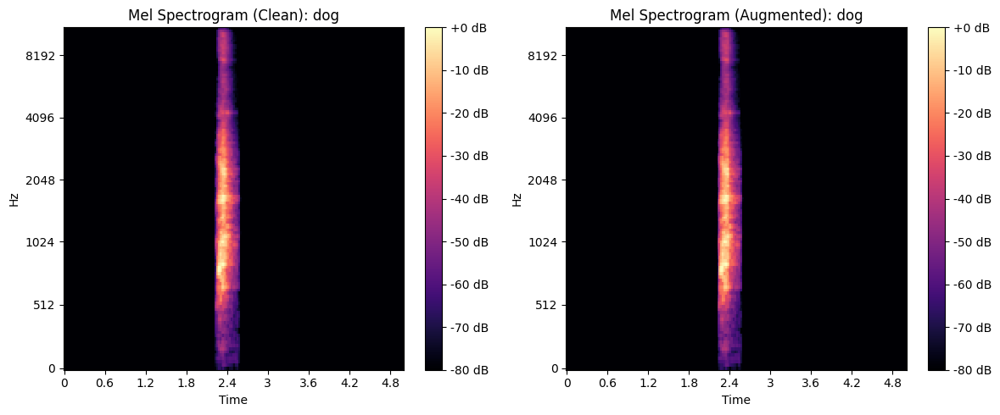

In [ ]:
# --- Visualizing Volume Changed (Mel Spectrogram) ---
plot_MelSpectrogram_vs_Augmented(mel_db_changed)

## Adding Augmentations

Now we will create different methods of augmentations and store each one to compare the preformance.

Note we will only apply the augmentations to the first 3 folds as they correspond to our training split


In [ ]:
# --- Load Test Path ---
test_path, test_label = df['filename'][0],df['category'][0]

y,sr = librosa.load(test_path)
mel = melspectrogram(y=y,sr=sr,n_fft=2048,hop_length=512,n_mels=128)
mel_db = librosa.power_to_db(mel,ref=np.max) # Covert To Log Scale

In [ ]:
def Augmentations_Balanced(y, sr):
    """
    Balanced augmentation: diverse but recognizable
    - 70% moderate augmentation
    - 30% aggressive augmentation
    """

    # Choose intensity
    if random.random() < 0.7:
        # Moderate: 2-3 augmentations, conservative parameters
        num_augs = random.randint(2, 3)
        intensity = 'moderate'
    else:
        # Aggressive: 3-4 augmentations, stronger parameters
        num_augs = random.randint(3, 4)
        intensity = 'aggressive'

    y_aug = y.copy()

    if intensity == 'moderate':
        # Conservative parameters
        augmentations = [
            ('shift', lambda: time_shift(y_aug)),
            ('stretch', lambda: librosa.effects.time_stretch(y_aug, rate=random.uniform(0.85, 1.15))),
            ('pitch', lambda: librosa.effects.pitch_shift(y_aug, sr=sr, n_steps=random.randint(-2, 2))),
            ('volume', lambda: change_volume(y_aug))
        ]
    else:  # aggressive
        # Stronger parameters
        augmentations = [
            ('shift', lambda: time_shift(y_aug)),
            ('stretch', lambda: librosa.effects.time_stretch(y_aug, rate=random.uniform(0.75, 1.35))),
            ('pitch', lambda: librosa.effects.pitch_shift(y_aug, sr=sr, n_steps=random.randint(-4, 4))),
            ('volume', lambda: change_volume(y_aug))
        ]

    # Apply random selection
    selected = random.sample(augmentations, k=num_augs)
    for name, aug_func in selected:
        y_aug = aug_func()

    return y_aug

In [ ]:
# --- Testing Balanced Augmentations ---

y_aug = Augmentations_Balanced(y,sr) # Add Augmentations

mel_aug = melspectrogram(y=y_aug,sr=sr,n_fft=2048,hop_length=512,n_mels=128)
mel_aug_db = librosa.power_to_db(mel_aug,ref=np.max) # Covert To Log Scale

print(f'Category (Augmented - Balanced): {test_label}\n') # Print the associated class
Audio(y_aug,rate=sr,autoplay=False) # Play noisy audio

Category (Augmented - Balanced): dog



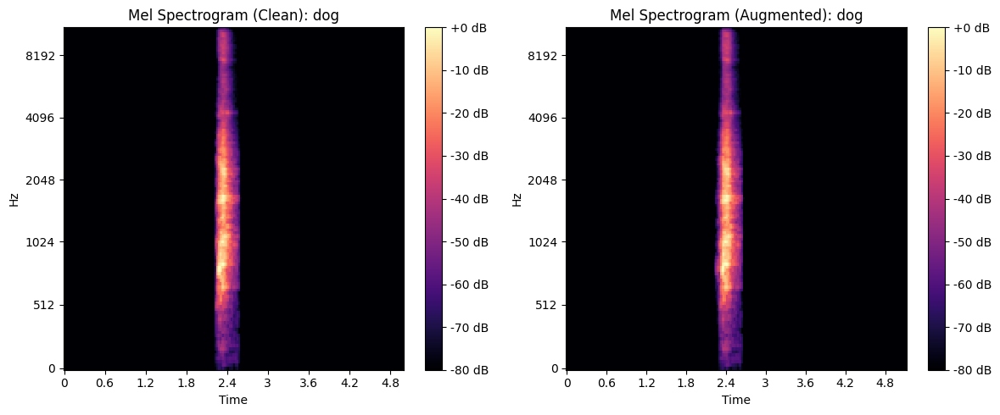

In [ ]:
# --- Visualize Balanced Augmentations ---
plot_MelSpectrogram_vs_Augmented(aug_db=mel_aug_db,label=test_label, clean_db = mel_db)

In [ ]:
def create_augmented_data(
    augmentation_method,
    n_samples_generated,
    augmentation_name,
    df,
    df_save_path='data/esc50_augmented.csv',
    path_to_audio='ESC-50/audio/',
    acoustic_augment = False
):
    aug_dir = os.path.join(path_to_audio, f"{augmentation_name}")
    os.makedirs(aug_dir, exist_ok=True)

    new_rows = []

    for i, path in enumerate(df["filename"]):
        row = df.iloc[i]
        fold, target, category = row["fold"], row["target"], row["category"]

        y, sr = librosa.load(path, sr=44100)
        base_name = os.path.splitext(os.path.basename(path))[0]

        for j in range(n_samples_generated):
          if acoustic_augment:
            y_aug = augmentation_method(y, sr,category)
          else:
            y_aug = augmentation_method(y, sr,category)


            if len(y_aug) != len(y):
                y_aug = librosa.util.fix_length(y_aug, size=len(y))

            filename = f"{base_name}-{augmentation_name}-{j}.wav"
            filepath = os.path.join(aug_dir, filename)

            sf.write(filepath, y_aug, sr)

            new_rows.append({
                "filename": filepath,
                "fold": fold,
                "target": target,
                "category": category
            })

        if (i + 1) % 100 == 0:
            print(f"Processed {i+1} files")

    df = pd.concat([df, pd.DataFrame(new_rows)], ignore_index=True)
    os.makedirs(os.path.dirname(df_save_path), exist_ok=True)
    df.to_csv(df_save_path, index=False)

    return df


In [ ]:
# --- Create the train dataframe using the balanced style augmentation --=

df = pd.read_csv("ESC-50/meta/esc50.csv")
df_aug = df.copy()
df_aug = df_aug.drop(['esc10','src_file','take'], axis=1)
df_aug = df_aug[df_aug['fold'].isin([1,2,3])]
df_aug['filename'] = df_aug['filename'].apply(lambda x: os.path.join(path_to_audio, x))  # prepend audio folder


train_df_balanced = create_augmented_data(augmentation_method=Augmentations_Balanced,
    n_samples_generated=7,
    augmentation_name='balanced_augmentation',
    df = df_aug,
    df_save_path='data/esc50_augmented_recipe.csv')

Processed 100 files
Processed 200 files
Processed 300 files
Processed 400 files
Processed 500 files
Processed 600 files
Processed 700 files
Processed 800 files
Processed 900 files
Processed 1000 files
Processed 1100 files
Processed 1200 files


In [ ]:
print(f'Number of samples in train set (Balanced Augmentation): {len(train_df_balanced)}')

Number of samples in train set (Balanced Augmentation): 9600


In [ ]:
# --- Save dataframes ---
save_path = "/content/gdrive/MyDrive/Colab_Notebooks/PyTorch_For_Beginners/projects/Audio-CNN/data"

train_df_balanced.to_csv(os.path.join(save_path,'train_df_balanced.csv'), index=False)



### Precomputing Mel Spectrograms


To speed up training and for reproducibility, we will create,transform, and download mel spectrograms to disk so that we will not need to handle this during training

In [ ]:
# --- Defining Transforms ---
train_transform = nn.Sequential(
    T.MelSpectrogram(
        sample_rate=22050,
        n_fft=1024,
        hop_length=512,
        n_mels=128,
        f_min=0,
        f_max=11025
    ),
    T.AmplitudeToDB(),
    # Apply masking to ~70% of samples (not 100%)
    # This gives model some clean examples too
    transforms.RandomApply([
        nn.Sequential(
            T.FrequencyMasking(freq_mask_param=30),
            T.TimeMasking(time_mask_param=80)
        )
    ], p=0.7),
    transforms.Resize((128,216))
)
test_transform = nn.Sequential(
  T.MelSpectrogram(
    sample_rate=22050,
    n_fft=1024,
    hop_length=512,
    n_mels=128,
    f_min=0,
    f_max=11025
  ),
  T.AmplitudeToDB(),
  transforms.Resize((128,216))
)

In [ ]:
def precompute_spectrograms(audio_paths, transform, out_dir):
    """
    audio_paths : list[str]
    labels      : list[int]
    transform   : torchaudio / torch transform
    out_dir     : directory to save spectrograms
    """

    os.makedirs(out_dir, exist_ok=True)

    for i,path in enumerate(audio_paths):
      if(i % 100 == 0):
        print(f"Computed {i} spectrograms")

      waveform, sr = torchaudio.load(path)
      spectrogram = transform(waveform)  # (1, n_mels, time)

      save_path = os.path.join(out_dir, f"{i:06d}.pt")
      torch.save(spectrogram, save_path)


In [ ]:
# --- Balanced Augmentations Spectrograms ---

### RUN ONLY ONCE WHEN DOWNLOADED
'''
train_df_balanced = pd.read_csv('data/train_df_balanced.csv')
out_dir_train = "precomputed_spectrograms/balanced_spectrograms_train/"

precompute_spectrograms(audio_paths = train_df_balanced['filename'].tolist(),
  transform = train_transform,
  out_dir = out_dir_train
)
'''


Computed 0 spectrograms
Computed 100 spectrograms
Computed 200 spectrograms
Computed 300 spectrograms
Computed 400 spectrograms
Computed 500 spectrograms
Computed 600 spectrograms
Computed 700 spectrograms
Computed 800 spectrograms
Computed 900 spectrograms
Computed 1000 spectrograms
Computed 1100 spectrograms
Computed 1200 spectrograms
Computed 1300 spectrograms
Computed 1400 spectrograms
Computed 1500 spectrograms
Computed 1600 spectrograms
Computed 1700 spectrograms
Computed 1800 spectrograms
Computed 1900 spectrograms
Computed 2000 spectrograms
Computed 2100 spectrograms
Computed 2200 spectrograms
Computed 2300 spectrograms
Computed 2400 spectrograms
Computed 2500 spectrograms
Computed 2600 spectrograms
Computed 2700 spectrograms
Computed 2800 spectrograms
Computed 2900 spectrograms
Computed 3000 spectrograms
Computed 3100 spectrograms
Computed 3200 spectrograms
Computed 3300 spectrograms
Computed 3400 spectrograms
Computed 3500 spectrograms
Computed 3600 spectrograms
Computed 3700

torch.Size([1, 128, 216])


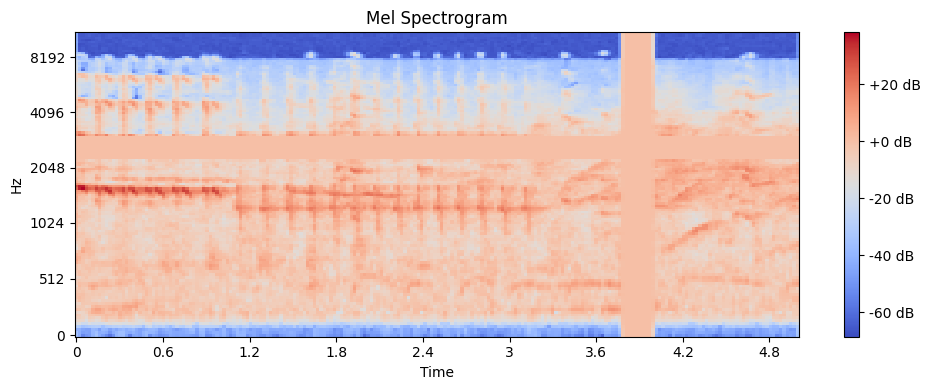

In [ ]:
# --- Load Balanced Augmented Sample ---
# Load tensor
mel_spectrogram = torch.load('precomputed_spectrograms/balanced_spectrograms_train/000001.pt')
print(mel_spectrogram.shape)

mel_spectrogram = mel_spectrogram.squeeze(0)  # now shape is (128, 216)
# Convert to NumPy
mel_spectrogram = mel_spectrogram.numpy()

# Plot
plt.figure(figsize=(10, 4))
librosa.display.specshow(mel_spectrogram, x_axis='time', y_axis='mel', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.title('Mel Spectrogram')
plt.tight_layout()
plt.show()


In [ ]:
# --- Validation Spectrograms ---

### RUN ONLY ONCE WHEN DOWNLOADED
'''
validation_df = df[df['fold'] == 4]

out_dir_validation = "precomputed_spectrograms/spectrograms_validation/"

precompute_spectrograms(audio_paths = validation_df['filename'].tolist(),
  transform = test_transform,
  out_dir = out_dir_validation
)
'''

Computed 0 spectrograms
Computed 100 spectrograms
Computed 200 spectrograms
Computed 300 spectrograms


In [ ]:
# Load tensor
mel_spectrogram = torch.load('precomputed_spectrograms/spectrograms_validation/000001.pt')
print(mel_spectrogram.shape)
mel_spectrogram = mel_spectrogram.squeeze(0)

# Convert to NumPy
mel_spectrogram = mel_spectrogram.numpy()

# Plot
plt.figure(figsize=(10, 4))
librosa.display.specshow(mel_spectrogram, x_axis='time', y_axis='mel', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.title('Mel Spectrogram')
plt.tight_layout()
plt.show()


In [ ]:
# --- Testing Spectrograms ---

### RUN ONLY ONCE WHEN DOWNLOADED
'''
test_df = df[df['fold'] == 5]
out_dir_test = "precomputed_spectrograms/spectrograms_test/"
precompute_spectrograms(audio_paths = test_df['filename'].tolist(),
  transform = test_transform,
  out_dir = out_dir_test
)
'''

'\ntest_df = df[df[\'fold\'] == 5]\nout_dir_test = "precomputed_spectrograms/spectrograms_test/"\nprecompute_spectrograms(audio_paths = test_df[\'filename\'].tolist(),\n  transform = test_transform,\n  out_dir = out_dir_test           \n)\n'

torch.Size([1, 128, 216])


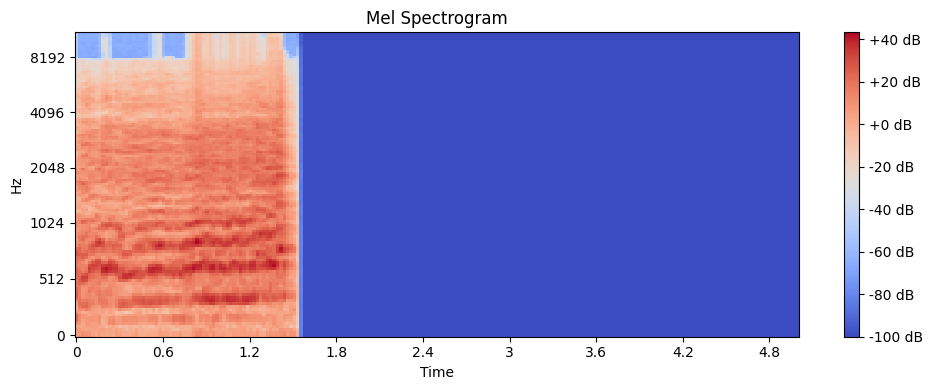

In [ ]:
# Load tensor
mel_spectrogram = torch.load('precomputed_spectrograms/spectrograms_test/000001.pt')
print(mel_spectrogram.shape)
mel_spectrogram = mel_spectrogram.squeeze(0)

# Convert to NumPy
mel_spectrogram = mel_spectrogram.numpy()

# Plot
plt.figure(figsize=(10, 4))
librosa.display.specshow(mel_spectrogram, x_axis='time', y_axis='mel', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.title('Mel Spectrogram')
plt.tight_layout()
plt.show()

## PyTorch Dataset

with the precomputed spectrograms now handled, we can now create a custom dataset that can handle loading in the spectrograms for model training

In [ ]:
# --- Optimized Dataset with Precomputed Spectrograms ---
class ESC50_Dataset(Dataset):
    def __init__(self,labels, mel_spectrograms_path):
        super().__init__()
        self.labels = labels
        self.paths = mel_spectrograms_path

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        mel = torch.load(self.paths[idx])  # shape [128, 216]
        if mel.dim() == 2:
            mel = mel.unsqueeze(0)  # add channel dimension -> [1, 128, 216]
        label = self.labels[idx]
        return mel, label

In [ ]:
# --- Data Splitting ---

# --- Load CSVs ---
train_df_reciepe = pd.read_csv('data/train_df_reciepe.csv')
train_df_balanced = pd.read_csv('data/train_df_balanced.csv')

# --- Define folds for validation and test ---
val_fold = 4
test_fold = 5

validation_df = df[df['fold'] == val_fold]
test_df = df[df['fold'] == test_fold]

# --- Extract labels ---
balanced_labels = train_df_balanced['target'].tolist()
val_labels = validation_df['target'].tolist()
test_labels = test_df['target'].tolist()

# --- Precomputed spectrogram directories ---
balanced_spectrogram_path = 'precomputed_spectrograms/balanced_spectrograms_train/'
val_spectrogram_path = 'precomputed_spectrograms/spectrograms_validation/'
test_spectrogram_path = 'precomputed_spectrograms/spectrograms_test/'

# --- Helper function to get sorted .pt files ---
def get_pt_files(directory):
    return sorted(glob.glob(os.path.join(directory, '*.pt')))

# --- Load .pt file paths ---
train_paths_balanced = get_pt_files(balanced_spectrogram_path)
val_paths = get_pt_files(val_spectrogram_path)
test_paths = get_pt_files(test_spectrogram_path)

# --- Sanity check: lengths match ---
assert len(train_paths_balanced) == len(balanced_labels), "Balanced train mismatch!"
assert len(val_paths) == len(val_labels), "Validation mismatch!"
assert len(test_paths) == len(test_labels), "Test mismatch!"

# --- Initialize datasets ---
train_data_balanced = ESC50_Dataset(balanced_labels, train_paths_balanced)
val_data = ESC50_Dataset(val_labels, val_paths)
test_data = ESC50_Dataset(test_labels, test_paths)

# --- Print dataset sizes ---
print(f'Train Samples (Balanced): {len(train_data_balanced)}')
print(f'Validation Samples: {len(val_data)}')
print(f'Test Samples: {len(test_data)}')


Train Samples (Reciepe): 9600
Train Samples (Balanced): 9600
Validation Samples: 400
Test Samples: 400


In [ ]:
# --- Test and Validation DataLoaders ---
batch_size = 32

validation_loader = DataLoader(
    dataset=val_data,
    shuffle = False,
    batch_size = batch_size,
    num_workers=4

)

test_loader = DataLoader(
    dataset=test_data,
    shuffle=False,
    batch_size=batch_size,
    num_workers=4
)

In [ ]:
# --- PyTorch DataLoaders (Augmentations) ---
batch_size = 32

train_loader_balanced = DataLoader(
    dataset=train_data_balanced,
    shuffle=True,
    batch_size=batch_size,
    num_workers=4
)


### ResNet 34 Model

With all the data preprocessing out of the way, we can move on to modeling. For these augmentations, we will use **ResNet 34**, a convolutional neural network (CNN) architecture designed for image recognition tasks. ResNet, short for **Residual Network**, was introduced by He et al. in 2015 and is well-known for enabling very deep networks without the problem of vanishing gradients.

#### Key Features of ResNet 34

1. **Residual Blocks**  
   - ResNet introduces *skip connections* or *residual connections*, which allow the input of a layer to bypass one or more layers and be added to the output.  
   - Mathematically:  
        ```
        y = F(x) + x
        ```
     where \(x\) is the input, \(F(x)\) is the output of the convolutional layers, and \(y\) is the final output of the block.  
   - This helps the network learn *residual mappings* instead of trying to learn the full transformation, which makes training deeper networks much easier.

2. **Depth and Structure**  
   - ResNet 34 is deeper than ResNet 18, with 34 layers consisting of convolutional, batch normalization, and ReLU activation layers arranged into residual blocks.  
   - This depth allows the model to capture more complex features from the input data while maintaining efficient gradient flow.

3. **Global Average Pooling and Fully Connected Layer**  
   - After passing through all the convolutional layers, ResNet applies global average pooling to reduce the spatial dimensions, followed by a fully connected layer that outputs class probabilities.

4. **Advantages for Our Task**  
   - Robust feature extraction from audio spectrograms or augmented data treated as images.  
   - Reduces the risk of overfitting due to residual connections and batch normalization.  
   - Supports transfer learning, meaning we can use pretrained weights on ImageNet to speed up training and improve performance on our dataset.

#### Summary

In short, ResNet 34 is a deep CNN with skip connections that allows efficient training of very deep networks. By using it on our preprocessed and augmented data, we can extract meaningful features and improve classification performance while leveraging the benefits of transfer learning.


In [ ]:
# --- Defining Residual Block For the ResNet34 Model ---
class ResidualBlock(nn.Module):
  """
    Initializes the Residual Block

    Argument:
      in_channels (int): Dimension of input features
      out_channels (int): Dimension of output features
      stride (int): How much the kernel moves across the image
    """
  def __init__(self, in_channels, out_channels, stride=1):
      super().__init__()


      # -- Layer 1 --
      self.conv1 = nn.Conv2d(
            in_channels, out_channels,
            kernel_size=3, stride=stride, padding=1, bias=False
      )
      self.bn1 = nn.BatchNorm2d(out_channels)

      # -- Layer 2 --
      self.conv2 = nn.Conv2d(
            out_channels, out_channels,
            kernel_size=3, padding=1, bias=False
        )
      self.bn2 = nn.BatchNorm2d(out_channels)

      # -- ShortCut --
      # We only use the shortcut when the channels are the same (no downsampling)
      self.apply_shortcut = stride != 1 or in_channels != out_channels
      if self.apply_shortcut:
        self.shortcut = nn.Sequential(
            nn.Conv2d(in_channels, out_channels,kernel_size = 1, stride = stride, padding = 0, bias = False),
            nn.BatchNorm2d(out_channels)

          )
      else:
        self.shortcut = None


  def forward(self, x):
      """
        Forward pass of the Residual Block

        Argument:
            x (torch.Tensor): Input tensor of shape (batch_size, in_channels, H, W).

        Returns:
            torch.Tensor: Output tensor after applying the residual block
      """
      shortcut = x

      out = self.conv1(x)
      out = self.bn1(out)
      out = torch.relu(out)

      out = self.conv2(out)
      out = self.bn2(out)

      if self.apply_shortcut:
        shortcut = self.shortcut(x)

      out = out + shortcut

      return torch.relu(out)



In [ ]:
class ResNet34(nn.Module):

    def __init__(self,in_channels=1,n_classes = 50):
        """
        A ResNet-style Convolutional Neural Network for audio classification using Mel spectrograms.

        Args:
            num_classes (int): Number of output classes (50 for the dataset).
        """
        super().__init__()

        # -- Define Convolutional Layer
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=in_channels,out_channels=64,kernel_size=7,stride=2,padding=3,bias = False), # Only 1 input channel for grayscale MEL Spectrogram
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2,padding=1)

        )
        # Create the layers of the model containing the residual blocks (refer to resnet diagram).
        self.layer1 = nn.ModuleList([ResidualBlock(64,64) for i in range(3)]) # Creates 3 Residual Blocks
        self.layer2 = nn.ModuleList([ResidualBlock(64 if i == 0 else 128,128,stride=2 if i == 0 else 1) for i in range(4)]) # Creates 4 Residual Blocks
        self.layer3 = nn.ModuleList([ResidualBlock(128 if i ==0 else 256,256,stride=2 if i == 0 else 1) for i in range(6)]) # Creates 6 Residual Blocks
        self.layer4 = nn.ModuleList([ResidualBlock(256 if i == 0 else 512,512,stride=2 if i == 0 else 1) for i in range(3)]) # Creates 3 Residual Blocks

        # Reduce the spatial grid of the 512 channels into a 1x1 value
        self.avg_pool = nn.AdaptiveAvgPool2d((1,1))
        self.dropout = nn.Dropout(0.5)

        self.fc = nn.Linear(512,n_classes)

    def forward(self,x):
        """
            Forward pass of the entire model

            Argument:
                x (torch.Tensor): Input tensor of shape (batch_size, in_channels, H, W).

            Returns:
                torch.Tensor: Output tensor after applying the residual block
        """
        x = self.conv1(x)
        for block in self.layer1:
            x = block(x)
        for block in self.layer2:
            x = block(x)
        for block in self.layer3:
            x = block(x)
        for block in self.layer4:
            x = block(x)

        x = self.avg_pool(x)
        x = x.view(x.size(0), -1) # Flattening the tensor
        x = self.dropout(x)
        x = self.fc(x)

        return x

In [ ]:
# --- Device ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# --- Hyperparameters ---
def get_hyperparams():
    params = {
        "n_epochs":50,
        "batch_size": 32,
        "lr": 0.0005,
        "weight_decay": 0.002,
        "max_lr": 0.0015,
        "label_smoothing": 0.05
    }
    return params

# --- Define optimizer and scheduler ---
def get_optimizer_scheduler(model, n_epochs, train_loader, params):
    optimizer = torch.optim.Adam(model.parameters(), lr=params["lr"], weight_decay=params["weight_decay"])
    scheduler = torch.optim.lr_scheduler.OneCycleLR(
        optimizer,
        max_lr=params["max_lr"],
        epochs=n_epochs,
        steps_per_epoch=len(train_loader),
        pct_start=0.1,
        div_factor=10,
        final_div_factor=100
    )
    return optimizer, scheduler

# --- Training function ---
def train_one_epoch(model, train_loader, criterion, optimizer, scheduler):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for inputs, labels in tqdm(train_loader, desc="Training"):
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        scheduler.step()

        running_loss += loss.item() * inputs.size(0)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

    epoch_loss = running_loss / total
    epoch_acc = correct / total * 100
    return epoch_loss, epoch_acc

# --- Validation function ---
def validate(model, val_loader, criterion):
    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    with torch.no_grad():
        for inputs, labels in tqdm(val_loader, desc="Validation"):
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            val_loss += loss.item() * inputs.size(0)
            _, predicted = outputs.max(1)
            val_total += labels.size(0)
            val_correct += predicted.eq(labels).sum().item()

    val_loss_epoch = val_loss / val_total
    val_acc_epoch = val_correct / val_total * 100
    return val_loss_epoch, val_acc_epoch

# --- Full training loop ---
def train_model(model, train_loader, val_loader):
    params = get_hyperparams()
    optimizer, scheduler = get_optimizer_scheduler(model, params["n_epochs"], train_loader, params)
    criterion = nn.CrossEntropyLoss(label_smoothing=params["label_smoothing"])

    train_logger, validation_logger = [], []
    train_acc_logger, validation_acc_logger = [], []

    for epoch in range(params["n_epochs"]):
        train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer, scheduler)
        val_loss, val_acc = validate(model, val_loader, criterion)

        train_logger.append(train_loss)
        validation_logger.append(val_loss)
        train_acc_logger.append(train_acc)
        validation_acc_logger.append(val_acc)

        print(f"Epoch {epoch+1}/{params['n_epochs']}: "
              f"Train Loss={train_loss:.4f}, Train Acc={train_acc:.2f}% | "
              f"Val Loss={val_loss:.4f}, Val Acc={val_acc:.2f}%")

    return train_logger, validation_logger, train_acc_logger, validation_acc_logger

# --- Plotting function ---
def plot_training(train_logger, validation_logger, train_acc_logger, validation_acc_logger):
    plt.figure(figsize=(12,5))
    plt.subplot(1,2,1)
    plt.plot(train_logger, label='Train Loss')
    plt.plot(validation_logger, label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Loss over Epochs')

    plt.subplot(1,2,2)
    plt.plot(train_acc_logger, label='Train Acc')
    plt.plot(validation_acc_logger, label='Val Acc')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.legend()
    plt.title('Accuracy over Epochs')
    plt.show()


### Balanced Augmentation Modeling

Now lets move onto the balanced augmentation modeling.

Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 1/50: Train Loss=3.1347, Train Acc=17.58% | Val Loss=2.5993, Val Acc=29.25%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 2/50: Train Loss=2.4422, Train Acc=34.18% | Val Loss=2.5306, Val Acc=35.25%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 3/50: Train Loss=2.1435, Train Acc=43.43% | Val Loss=3.1160, Val Acc=35.75%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 4/50: Train Loss=1.9821, Train Acc=48.07% | Val Loss=2.2352, Val Acc=40.00%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 5/50: Train Loss=1.8731, Train Acc=52.20% | Val Loss=2.4548, Val Acc=39.50%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 6/50: Train Loss=1.7510, Train Acc=55.91% | Val Loss=1.9635, Val Acc=53.00%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 7/50: Train Loss=1.6448, Train Acc=60.22% | Val Loss=1.7404, Val Acc=57.25%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 8/50: Train Loss=1.5743, Train Acc=63.25% | Val Loss=2.1328, Val Acc=46.75%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 9/50: Train Loss=1.4750, Train Acc=66.52% | Val Loss=2.0430, Val Acc=50.75%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 10/50: Train Loss=1.3925, Train Acc=69.52% | Val Loss=1.9308, Val Acc=56.25%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 11/50: Train Loss=1.3121, Train Acc=72.66% | Val Loss=1.6686, Val Acc=63.25%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 12/50: Train Loss=1.2447, Train Acc=74.53% | Val Loss=2.1493, Val Acc=52.75%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 13/50: Train Loss=1.1648, Train Acc=77.51% | Val Loss=1.9389, Val Acc=57.50%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 14/50: Train Loss=1.1070, Train Acc=79.44% | Val Loss=1.7115, Val Acc=63.25%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 15/50: Train Loss=1.0714, Train Acc=81.25% | Val Loss=1.4052, Val Acc=70.00%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 16/50: Train Loss=0.9865, Train Acc=84.43% | Val Loss=1.5452, Val Acc=67.50%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 17/50: Train Loss=0.9868, Train Acc=84.28% | Val Loss=1.6100, Val Acc=66.75%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 18/50: Train Loss=0.9409, Train Acc=85.79% | Val Loss=1.3513, Val Acc=72.50%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 19/50: Train Loss=0.9053, Train Acc=86.59% | Val Loss=1.7052, Val Acc=62.50%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 20/50: Train Loss=0.8728, Train Acc=88.09% | Val Loss=1.6412, Val Acc=63.75%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 21/50: Train Loss=0.8169, Train Acc=89.88% | Val Loss=1.6347, Val Acc=63.00%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 22/50: Train Loss=0.8209, Train Acc=89.92% | Val Loss=1.6374, Val Acc=64.00%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 23/50: Train Loss=0.7990, Train Acc=90.74% | Val Loss=1.5523, Val Acc=66.25%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 24/50: Train Loss=0.7507, Train Acc=92.35% | Val Loss=1.6467, Val Acc=63.50%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 25/50: Train Loss=0.7303, Train Acc=92.92% | Val Loss=1.2613, Val Acc=73.75%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 26/50: Train Loss=0.7008, Train Acc=93.74% | Val Loss=1.3432, Val Acc=74.50%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 27/50: Train Loss=0.6759, Train Acc=94.62% | Val Loss=1.3666, Val Acc=73.50%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 28/50: Train Loss=0.6678, Train Acc=95.09% | Val Loss=1.4006, Val Acc=70.75%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 29/50: Train Loss=0.6407, Train Acc=95.61% | Val Loss=1.4158, Val Acc=72.25%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 30/50: Train Loss=0.6291, Train Acc=95.99% | Val Loss=1.4665, Val Acc=68.25%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 31/50: Train Loss=0.6042, Train Acc=96.88% | Val Loss=1.2227, Val Acc=75.75%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 32/50: Train Loss=0.5886, Train Acc=97.38% | Val Loss=1.3446, Val Acc=73.00%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 33/50: Train Loss=0.5651, Train Acc=97.77% | Val Loss=1.2803, Val Acc=75.75%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 34/50: Train Loss=0.5633, Train Acc=97.86% | Val Loss=1.3499, Val Acc=71.50%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 35/50: Train Loss=0.5335, Train Acc=98.51% | Val Loss=1.1792, Val Acc=76.50%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 36/50: Train Loss=0.5205, Train Acc=99.00% | Val Loss=1.2246, Val Acc=77.75%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 37/50: Train Loss=0.5079, Train Acc=99.16% | Val Loss=1.1481, Val Acc=78.00%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 38/50: Train Loss=0.4950, Train Acc=99.24% | Val Loss=1.1739, Val Acc=78.50%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 39/50: Train Loss=0.4898, Train Acc=99.41% | Val Loss=1.1021, Val Acc=78.00%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 40/50: Train Loss=0.4726, Train Acc=99.70% | Val Loss=1.1590, Val Acc=77.75%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 41/50: Train Loss=0.4714, Train Acc=99.62% | Val Loss=1.1273, Val Acc=78.00%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 42/50: Train Loss=0.4640, Train Acc=99.66% | Val Loss=1.1091, Val Acc=79.25%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 43/50: Train Loss=0.4579, Train Acc=99.80% | Val Loss=1.0479, Val Acc=81.25%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 44/50: Train Loss=0.4551, Train Acc=99.80% | Val Loss=1.0777, Val Acc=80.75%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 45/50: Train Loss=0.4469, Train Acc=99.85% | Val Loss=1.0756, Val Acc=80.00%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 46/50: Train Loss=0.4448, Train Acc=99.93% | Val Loss=1.0711, Val Acc=80.50%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 47/50: Train Loss=0.4419, Train Acc=99.93% | Val Loss=1.0751, Val Acc=79.50%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78476c04efc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
 Exception ignored in:  <function _MultiProcessingDataLoaderIter.__del__ at 0x78476c04efc0> 
  Traceback (most recent call last):
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
     ^self._shutdown_workers()^
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
   ^^ ^ ^ ^ ^^^^^^^^^^
^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^    ^assert self._parent_pid == os.getpid(), 'can only test a child process'^
^ ^ ^ 
   File "/usr/lib/py

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 48/50: Train Loss=0.4388, Train Acc=99.98% | Val Loss=1.0459, Val Acc=81.50%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78476c04efc0>Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x78476c04efc0>Traceback (most recent call last):

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
      File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
self._shutdown_workers()
      File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
if w.is_alive(): 
            ^ ^^^^^^^^^^^^^^^^^^^^^
^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^
      File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
assert self._par

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 49/50: Train Loss=0.4377, Train Acc=100.00% | Val Loss=1.0537, Val Acc=81.50%


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78476c04efc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
Exception ignored in:     <function _MultiProcessingDataLoaderIter.__del__ at 0x78476c04efc0>if w.is_alive():

 Traceback (most recent call last):
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
      self._shutdown_workers() 
    File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    ^if w.is_alive():^
^ ^ ^^ ^ ^  ^^^ ^^
^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^    ^^assert self._parent_pid == os.getpid(), 'can only test a child process'^
^ ^ ^ ^^ ^
   File "/usr/lib/p

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78476c04efc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78476c04efc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 50/50: Train Loss=0.4387, Train Acc=99.98% | Val Loss=1.0551, Val Acc=80.25%


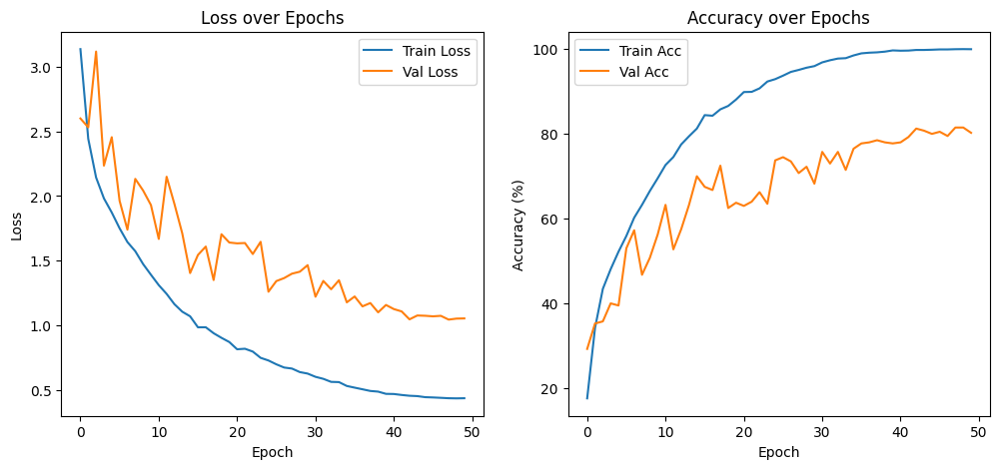

In [ ]:
# --- Balanced Model Training ---

resNet_balanced = ResNet34().to(device)

train_logger_balanced, validation_logger_balanced, train_acc_logger_balanced, validation_acc_logger_balanced = train_model(resNet_balanced, train_loader_balanced, validation_loader)

plot_training(train_logger_balanced, validation_logger_balanced, train_acc_logger_balanced, validation_acc_logger_balanced)


In [ ]:
# --- Evalutate Balanced Model
criterion = nn.CrossEntropyLoss(label_smoothing=0.05)
test_acc,loss = evaluate(resNet_balanced,criterion,device,test_loader)
print(f'Test Accuracy: {test_acc}%')

Evaluating:   0%|          | 0/13 [00:00<?, ?it/s]

Test Accuracy: 71.0%


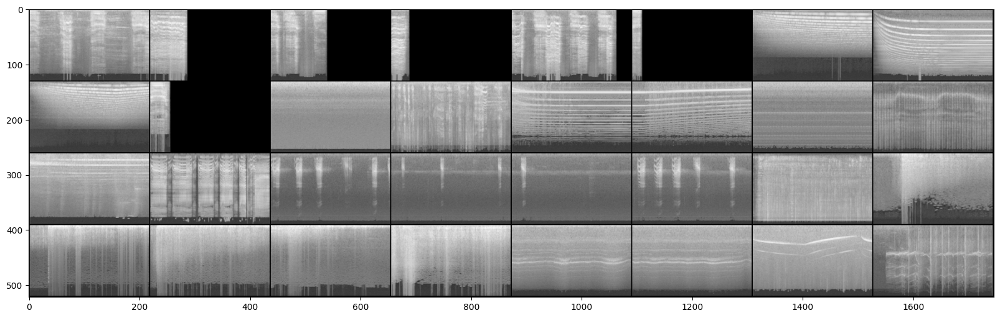

In [ ]:
dataiter = iter(test_loader)
test_imgs,test_labels = next(dataiter)

# --- Visualizing One Batch ---
plt.figure(figsize = (20,10))
out = torchvision.utils.make_grid(test_imgs, 8, normalize=True)
plt.imshow(out.numpy().transpose((1, 2, 0)))

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

all_preds = []
all_labels = []

resNet_balanced.eval()
with torch.no_grad():
    for imgs, labels in test_loader:
        imgs = imgs.to(device)
        labels = labels.to(device)

        outputs = resNet_balanced(imgs)
        preds = outputs.argmax(dim=1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())


In [ ]:
# Classification report
print(classification_report(all_labels, all_preds))


              precision    recall  f1-score   support

           0       0.88      0.88      0.88         8
           1       0.89      1.00      0.94         8
           2       0.57      0.50      0.53         8
           3       0.62      1.00      0.76         8
           4       0.43      0.38      0.40         8
           5       0.60      0.75      0.67         8
           6       1.00      0.75      0.86         8
           7       1.00      0.75      0.86         8
           8       0.89      1.00      0.94         8
           9       1.00      0.88      0.93         8
          10       0.88      0.88      0.88         8
          11       0.89      1.00      0.94         8
          12       0.60      0.38      0.46         8
          13       0.54      0.88      0.67         8
          14       0.67      0.75      0.71         8
          15       0.75      0.38      0.50         8
          16       0.50      0.38      0.43         8
          17       0.71    

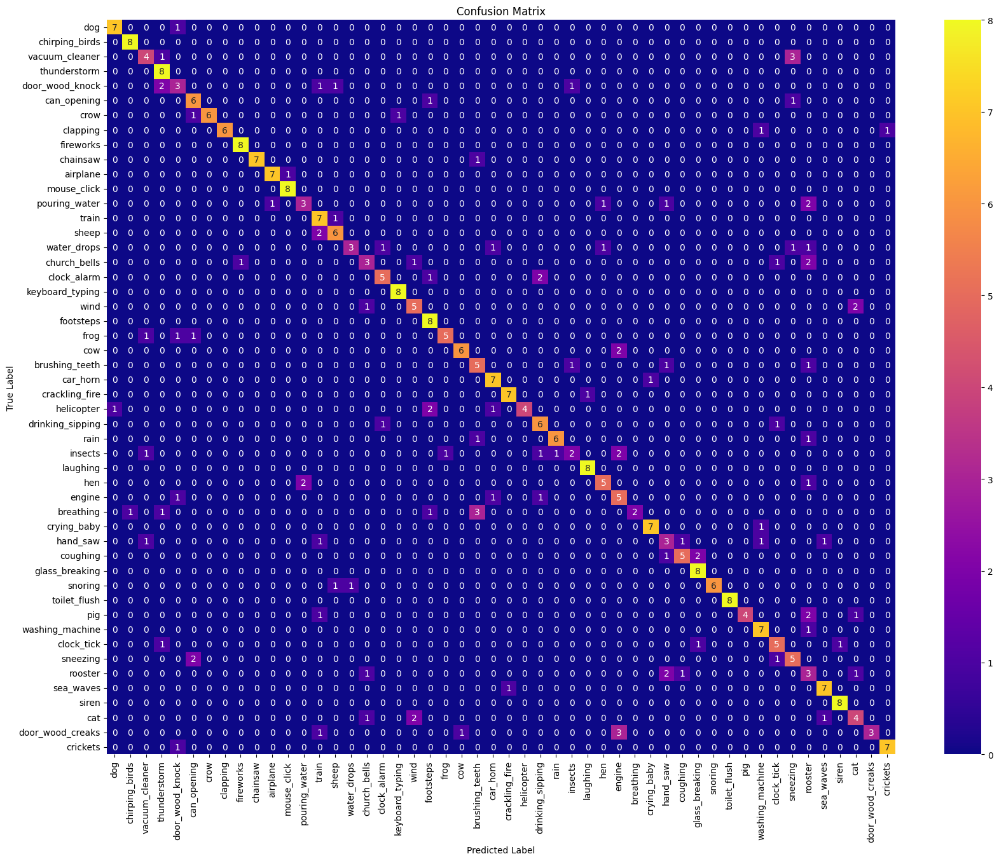

In [ ]:
# --- Plot Confusion Matrix ---
cm = confusion_matrix(all_labels, all_preds)
classes = df['category'].unique()
plt.figure(figsize=(20,15))
sns.heatmap(cm, annot=True, fmt='d', cmap='plasma',xticklabels=classes,yticklabels=classes)
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Confusion Matrix')
plt.show()

## Balanced Model Takeaways

- **Training performance:** The model reaches a peak training accuracy of **99.8%**, indicating that it has memorized the training set effectively. This high training performance shows that the network capacity is sufficient to capture the patterns in the dataset, but it also suggests potential overfitting, as the model may be relying on fine-grained details of the training spectrograms rather than learning robust, invariant features.

- **Validation performance:** Validation accuracy peaks at **81.25%**, which is substantially lower than training accuracy. This gap suggests that while the model can generalize to data similar to what it has seen during training, it struggles with variations or distortions not present in the training set. The moderate generalization indicates that the model has learned some features that are transferable, but may also be sensitive to augmentation artifacts or minor spectral variations.

- **Test performance:** The test accuracy of **71%** reflects a further drop in generalization to completely unseen data. This decline highlights that the model is particularly challenged by certain classes, likely due to spectral similarities between classes, short-duration events, or sensitivity to waveform augmentation. It indicates that the learned features are not fully invariant to these variations.

- **Classification report insights:** The report shows a mix of high and low F1-scores across classes. Classes with high F1-scores (>0.85) correspond to sounds with strong, distinct spectral signatures, which the model captures reliably. Low F1-scores (0.27–0.40) are seen in classes with transient, overlapping, or easily distorted sounds, indicating the model struggles with these. This pattern suggests that the network prioritizes dominant or long-duration spectral patterns and fails to generalize well on subtle or ambiguous classes.

- **Potential insights:**
  - Over-augmentation during training may have distorted semantic features for some classes, hurting test performance.
  - The gap between validation and test accuracy may indicate fold-specific differences or insufficient coverage of rare or challenging sound events.
  - High training accuracy combined with moderate test accuracy indicates memorization rather than robust feature learning.
  - Weak classes could benefit from targeted augmentation, improved preprocessing, or leveraging pretrained audio representations that capture invariant spectral and temporal patterns.

- **Overall conclusion:** While the CNN pipeline performs strongly on easily recognizable classes, it exhibits clear limitations in generalization to more challenging sounds. Improvements such as moderated augmentation, careful fold management, or using pretrained audio models (e.g., CNN14, PANNs) are likely necessary to increase overall test performance and stabilize predictions across all classes.


## New Strategy

From the previous augmentation experiments, a consistent pattern emerged: several classes struggled to learn stable and discriminative features. Notably, classes such as door_wood_knock, pouring_water, water_drops, church_bells, insects, breathing, hand_saw, and rooster showed weaker learning compared to others.

To address this, a more targeted augmentation strategy can be applied based on sound type rather than treating all classes uniformly. Specifically, classes can be grouped into broader acoustic categories (e.g., animals, natural soundscapes & water sounds, human non-speech sounds, interior/domestic sounds, and exterior/urban noises), with augmentation policies tailored to each group.

The motivation behind this approach is that randomly applying identical augmentations across all classes can overly distort certain sounds and harm feature learning. Not all audio classes share the same acoustic constraints or perceptual characteristics, and therefore should not receive equal augmentation strength. For example, church bells occupy a relatively constrained frequency range, and aggressive pitch shifting (e.g., shifting down by two semitones or more) can produce unrealistic samples that deviate from the true class distribution. In such cases, augmentation may introduce noise rather than useful variability, ultimately degrading model performance.

By conditioning augmentation type and intensity on sound category, the model is more likely to learn invariant yet realistic features, improving generalization for acoustically sensitive or low-variability classes.


Before getting into this, lets do some further EDA

### Investing Acoustic Categories

In [ ]:
# --- Load audio files into dataframe ---
df = pd.read_csv('ESC-50/meta/esc50.csv')
df = df.drop(['esc10','src_file','take'],axis = 1) # Drop unused features
audio_path = 'ESC-50/audio/'
df['filename'] = audio_path + df['filename']
df.head()

,filename,fold,target,category
0,ESC-50/audio/1-100032-A-0.wav,1,0,dog
1,ESC-50/audio/1-100038-A-14.wav,1,14,chirping_birds
2,ESC-50/audio/1-100210-A-36.wav,1,36,vacuum_cleaner
3,ESC-50/audio/1-100210-B-36.wav,1,36,vacuum_cleaner
4,ESC-50/audio/1-101296-A-19.wav,1,19,thunderstorm


In [ ]:
classes = df['category'].unique()
classes_to_idx = {cls:idx for idx,cls in enumerate(classes)}

classes_to_idx

{'dog': 0,
 'chirping_birds': 1,
 'vacuum_cleaner': 2,
 'thunderstorm': 3,
 'door_wood_knock': 4,
 'can_opening': 5,
 'crow': 6,
 'clapping': 7,
 'fireworks': 8,
 'chainsaw': 9,
 'airplane': 10,
 'mouse_click': 11,
 'pouring_water': 12,
 'train': 13,
 'sheep': 14,
 'water_drops': 15,
 'church_bells': 16,
 'clock_alarm': 17,
 'keyboard_typing': 18,
 'wind': 19,
 'footsteps': 20,
 'frog': 21,
 'cow': 22,
 'brushing_teeth': 23,
 'car_horn': 24,
 'crackling_fire': 25,
 'helicopter': 26,
 'drinking_sipping': 27,
 'rain': 28,
 'insects': 29,
 'laughing': 30,
 'hen': 31,
 'engine': 32,
 'breathing': 33,
 'crying_baby': 34,
 'hand_saw': 35,
 'coughing': 36,
 'glass_breaking': 37,
 'snoring': 38,
 'toilet_flush': 39,
 'pig': 40,
 'washing_machine': 41,
 'clock_tick': 42,
 'sneezing': 43,
 'rooster': 44,
 'sea_waves': 45,
 'siren': 46,
 'cat': 47,
 'door_wood_creaks': 48,
 'crickets': 49}

In [ ]:
df_animals = df[df['category'].isin(['dog','crow','sheep','frog','cow','insects','hen','pig','rooster','cat'])]
print(f'Animals Dataframe: {df_animals.shape}\n')
df_animals.head()

Animals Dataframe: (400, 4)



,filename,fold,target,category
0,ESC-50/audio/1-100032-A-0.wav,1,0,dog
8,ESC-50/audio/1-103298-A-9.wav,1,9,crow
14,ESC-50/audio/1-110389-A-0.wav,1,0,dog
29,ESC-50/audio/1-121951-A-8.wav,1,8,sheep
45,ESC-50/audio/1-15689-A-4.wav,1,4,frog


In [ ]:
df_natural_sounds = df[df['category'].isin(['thunderstorm','pouring_water','water_drops','wind','crackling_fire','rain','sea_waves','crickets','chirping_birds','toilet_flush'])]
print(f'Natural SoundScapes Dataframe: {df_natural_sounds.shape}\n')
df_natural_sounds.head()

Natural SoundScapes Dataframe: (400, 4)



,filename,fold,target,category
1,ESC-50/audio/1-100038-A-14.wav,1,14,chirping_birds
4,ESC-50/audio/1-101296-A-19.wav,1,19,thunderstorm
5,ESC-50/audio/1-101296-B-19.wav,1,19,thunderstorm
16,ESC-50/audio/1-115521-A-19.wav,1,19,thunderstorm
27,ESC-50/audio/1-118559-A-17.wav,1,17,pouring_water


In [ ]:
df_human_nonSpeech = df[df['category'].isin(['crying_baby','sneezing','clapping','breathing','coughing','footsteps','laughing','brushing_teeth','snoring','drinking_sipping'])]
print(f'Human-non speech sounds Dataframe: {df_human_nonSpeech.shape}\n')
df_human_nonSpeech.head()

Human-non speech sounds Dataframe: (400, 4)



,filename,fold,target,category
11,ESC-50/audio/1-104089-A-22.wav,1,22,clapping
12,ESC-50/audio/1-104089-B-22.wav,1,22,clapping
13,ESC-50/audio/1-105224-A-22.wav,1,22,clapping
15,ESC-50/audio/1-110537-A-22.wav,1,22,clapping
21,ESC-50/audio/1-115920-A-22.wav,1,22,clapping


In [ ]:
df_interior_domestic = df[df['category'].isin(['door_wood_knock','mouse_click','keyboard_typing','door_wood_creaks','can_opening','washing_machine','vacuum_cleaner','clock_alarm','clock_tick','glass_breaking'])]
print(f'Interior/Domestic Dataframe: {df_interior_domestic.shape}\n')
df_interior_domestic.head()

Interior/Domestic Dataframe: (400, 4)



,filename,fold,target,category
2,ESC-50/audio/1-100210-A-36.wav,1,36,vacuum_cleaner
3,ESC-50/audio/1-100210-B-36.wav,1,36,vacuum_cleaner
6,ESC-50/audio/1-101336-A-30.wav,1,30,door_wood_knock
7,ESC-50/audio/1-101404-A-34.wav,1,34,can_opening
9,ESC-50/audio/1-103995-A-30.wav,1,30,door_wood_knock


In [ ]:
df_urban = df[df['category'].isin(['helicopter','chainsaw','siren','car_horn','engine','train','church_bells','airplane','fireworks','hand_saw'])]

print(f'Exterior / Urban DataFrame: {df_urban.shape}\n')
df_urban.head()


Exterior / Urban DataFrame: (400, 4)



,filename,fold,target,category
17,ESC-50/audio/1-115545-A-48.wav,1,48,fireworks
18,ESC-50/audio/1-115545-B-48.wav,1,48,fireworks
19,ESC-50/audio/1-115545-C-48.wav,1,48,fireworks
20,ESC-50/audio/1-115546-A-48.wav,1,48,fireworks
24,ESC-50/audio/1-116765-A-41.wav,1,41,chainsaw


### EDA

In [ ]:
# --- Function to plot unique values of a dataframe ---
def plot_acoustic_soundwave(df):
  df = df.drop_duplicates(subset=['target']).sort_values(by='target').reset_index(drop=True)
  n = len(df)
  rows = (n // 3) + 1
  plt.figure(figsize=(12, rows * 3))

  for i in range(n):
    audio_path = df.iloc[i]['filename']
    y, sr = librosa.load(audio_path)

    plt.subplot(rows, 3, i + 1)
    librosa.display.waveshow(y=y, sr=sr)
    plt.title(f"Class: {df.iloc[i]['target']} : {df.iloc[i]['category']}")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")

  plt.tight_layout(pad=3.0)
  plt.show()


In [ ]:
# --- Function to plot unique values of a dataframe ---
def plot_acoustic_mel_spectrogram(df):
  df = df.drop_duplicates(subset=['target']).sort_values(by='target').reset_index(drop=True)
  n = len(df)
  rows = (n // 3) + 1
  plt.figure(figsize=(12, rows * 3))

  for i in range(n):
      audio_path = df.iloc[i]['filename']
      y, sr = librosa.load(audio_path)

      # n_fft: Number of audio samples in the Fourier window (↑ n_ffts: better frequency, worse time resolution, ↓ worse frequency, better time resolution)
      # hop_length: The number of samples to shift the window for next FFT
      # n_mels: numbers of mel frequency bands to divide the frequency axis
      mel = melspectrogram(y=y,sr=sr,n_fft=2048,hop_length=512,n_mels=128) # Returns a numpy array of (number of mel frequency bands, time frames)

      mel_db = librosa.power_to_db(mel,ref=np.max) # Covert To Log Scale

      plt.subplot(rows, 3, i + 1)
      librosa.display.specshow(mel_db,x_axis='time',y_axis='mel',sr=sr)
      plt.colorbar(format='%+2.0f db')
      plt.title(f"Class: {df.iloc[i]['target']} : {df.iloc[i]['category']}")
  plt.tight_layout(pad=3.0)
  plt.show()



In [ ]:
def plot_MelSpectrogram_vs_Augmented(clean_db, aug_db, sr, label, title):
    plt.figure(figsize=(12, 5))

    # --- Clean audio ---
    plt.subplot(1, 2, 1)
    librosa.display.specshow(clean_db, sr=sr, x_axis='time', y_axis='mel')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Mel Spectrogram (Clean): {label}')

    # --- Augmented audio ---
    plt.subplot(1, 2, 2)
    librosa.display.specshow(aug_db, sr=sr, x_axis='time', y_axis='mel')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'{title}: {label}')

    plt.tight_layout()
    plt.show()


In [ ]:
def test_augmentation(df, idx, augmentation_method):
    test_path = df.iloc[idx]['filename']
    test_label = df.iloc[idx]['category']

    # Load audio
    y, sr = librosa.load(test_path)

    # Clean mel
    mel = librosa.feature.melspectrogram(
        y=y, sr=sr, n_fft=2048, hop_length=512, n_mels=128
    )
    mel_db = librosa.power_to_db(mel, ref=np.max)

    # Augment
    y_aug = augmentation_method(y, sr)

    # Augmented mel
    mel_aug = librosa.feature.melspectrogram(
        y=y_aug, sr=sr, n_fft=2048, hop_length=512, n_mels=128
    )
    mel_db_aug = librosa.power_to_db(mel_aug, ref=np.max)

    # Plot comparison
    plot_MelSpectrogram_vs_Augmented(
        clean_db=mel_db,
        aug_db=mel_db_aug,
        sr=sr,
        label=test_label,
        title="Mel Spectrogram (Augmented)"
    )

    return y_aug, test_path, test_label


### Animal Augmentations

In [ ]:
# --- Animal Augmentations ---
def augment_animals(y,sr):
  y_aug = y.copy()

  # Moderate pitch variation
  if random.random() < 0.7:
    y_aug = librosa.effects.pitch_shift(y_aug,sr=sr,n_steps=random.randint(-1,1))

  if random.random() < 0.6:
    y_aug = add_outdoor_ambience(y_aug)

  if random.random() < 0.5:
    y_aug = change_volume(y_aug,factor=random.uniform(0.6,1.4)) # 40% louder or quieter

  if random.random() < 0.3:
    y_aug = time_stretch(y_aug, rate=random.uniform(0.9,1.1)) # Slowed down or speed up at most 10%

  return y_aug


def add_outdoor_ambience(y):
  """
    Simulates outdoor environment
  """
  # Gentle wind + distant bird chirps
  ambience = np.random.randn(len(y)) * 0.002
  # Low-pass filter for wind-like sound
  b, a = butter(2, 0.05, btype='low')
  ambience = filtfilt(b, a, ambience)
  return y + ambience * random.uniform(0.05, 0.15)

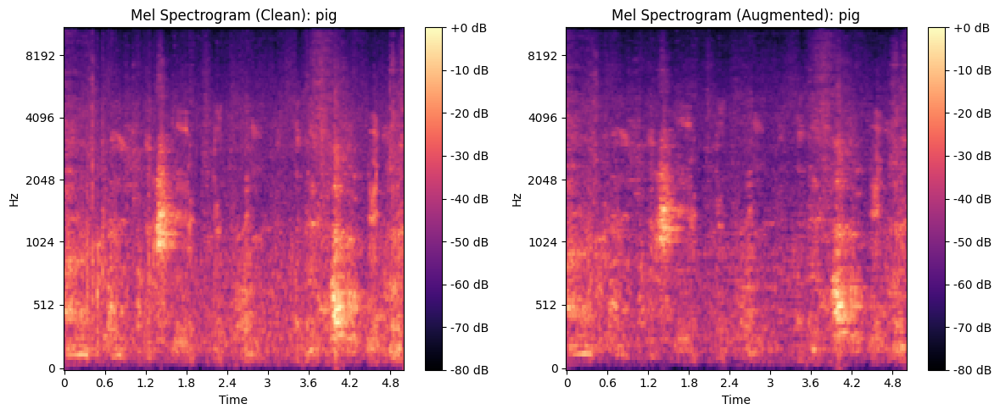


Category (Animal - Augmentation): pig



In [ ]:
# --- Testing Anmial Augmentation ---
y_aug, test_path, test_label = test_augmentation(df_animals,20,augment_animals)
print(f'\nCategory (Animal - Augmentation): {test_label}\n')
Audio(y_aug,rate=sr,autoplay=False)

### Natural Soundscapes Augmentation

In [ ]:
def augment_natural_soundscapes(y,sr):
  y_aug = y.copy()

  if random.random() < 0.7:
    y_aug = time_stretch(y_aug,rate=random.uniform(0.75,1.3))

  if random.random() < 0.7:
    y_aug = change_volume(y_aug, factor=random.uniform(0.5, 1.5))

  # Add environmental depth (reverb simulation)
  if random.random() < 0.5:
    y_aug = add_reverb_simple(y_aug)

  # Light time shift (continuous sounds tolerate this well)
  if random.random() < 0.4:
    y_aug = time_shift(y_aug, scale=random.uniform(0.1, 0.2))

  return y_aug


def add_reverb_simple(y, room_size='medium'):
    """Simple reverb simulation using convolution"""
    room_sizes = {
        'small': 0.3,
        'medium': 0.5,
        'large': 0.8
    }

    decay = room_sizes.get(room_size, 0.5)
    delay_samples = int(0.05 * 22050)  # 50ms delay

    # Create simple impulse response
    impulse = np.zeros(delay_samples)
    impulse[0] = 1.0
    impulse[delay_samples//2] = decay * 0.5
    impulse[-1] = decay * 0.3

    # Convolve
    y_reverb = np.convolve(y, impulse, mode='same')

    # Mix with dry signal
    wet_mix = random.uniform(0.15, 0.4)
    return y * (1 - wet_mix) + y_reverb * wet_mix




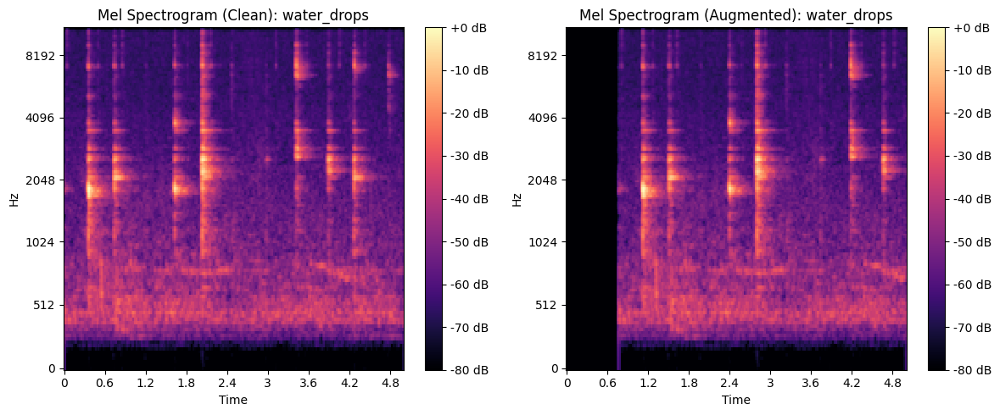


Category (Natural Soundscapes - Augmentation): water_drops



In [ ]:
# --- Testing Natural soundscapes Augmentation ---
y_aug, test_path, test_label = test_augmentation(df_natural_sounds,18,augment_natural_soundscapes)
print(f'\nCategory (Natural Soundscapes - Augmentation): {test_label}\n')
Audio(y_aug,rate=sr,autoplay=False)

###  Human Non Speech

In [ ]:
def augment_human_non_speech(y, sr):
    """
    Human sounds: Pitch variation (adults vs children), room acoustics
    - Baby cries are high-pitched, adult coughs are lower
    - Indoor reverb is common
    - Age/gender differences = pitch changes
    """
    y_aug = y.copy()

    # Wide pitch variation (children vs adults, male vs female)
    if random.random() < 0.7:
        n_steps = random.randint(-4, 4)
        y_aug = librosa.effects.pitch_shift(y_aug, sr=sr, n_steps=n_steps)

    # Room acoustics / reverb
    if random.random() < 0.6:
        y_aug = add_reverb_simple(y_aug)

    # Volume (distance from microphone)
    if random.random() < 0.6:
        y_aug = change_volume(y_aug, factor=random.uniform(0.6, 1.4))

    # Moderate time stretch (people do things at different speeds)
    if random.random() < 0.5:
      y_aug = time_stretch(y_aug,rate=random.uniform(0.85,1.2))

    # Indoor background noise
    if random.random() < 0.4:
        y_aug = add_indoor_ambience(y_aug)

    return y_aug


def add_indoor_ambience(y):
    """Simulate indoor environment"""
    # AC hum (60 Hz) + room tone
    t = np.linspace(0, len(y)/22050, len(y))
    hum = np.sin(2 * np.pi * 60 * t) * 0.001
    room_tone = np.random.randn(len(y)) * 0.001
    ambience = hum + room_tone
    return y + ambience * random.uniform(0.03, 0.1)


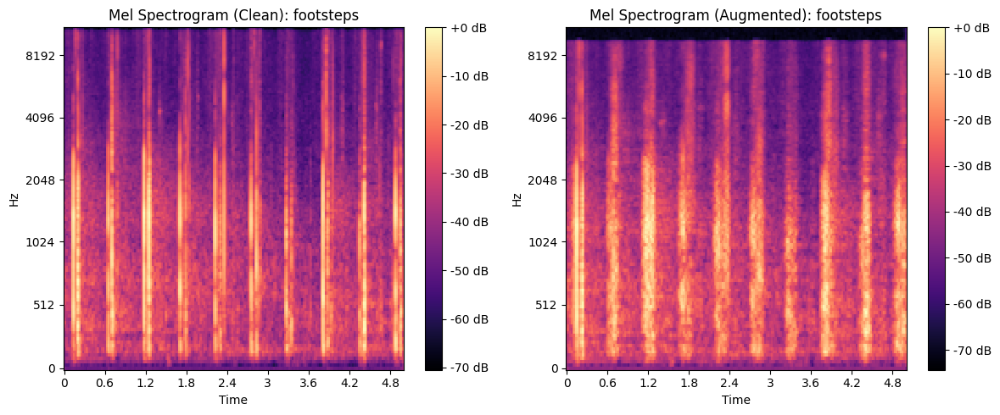


Category (Human Non Speech - Augmentation): footsteps



In [ ]:
# --- Testing Human Nonspeech Augmentation ---
y_aug, test_path, test_label = test_augmentation(df_human_nonSpeech,10,augment_human_non_speech)
print(f'\nCategory (Human Non Speech - Augmentation): {test_label}\n')
Audio(y_aug,rate=sr,autoplay=False)

### Interior/Domestic Sounds

In [ ]:
def augment_interior_domestic(y, sr):
  """
  Interior sounds: Room acoustics, muffled versions, background hum
    - Mechanical sounds from different rooms (muffled)
    - Indoor reverb patterns
    - Electrical hum from appliances
  """
  y_aug = y.copy()

  # Strong room acoustics
  if random.random() < 0.7:
    y_aug = add_reverb_simple(y_aug)

  # Volume variation (near/far in room, through walls)
  if random.random() < 0.7:
    y_aug = change_volume(y_aug, factor=random.uniform(0.4, 1.3))

  # Indoor background (AC, fridge hum, etc.)
  if random.random() < 0.6:
    y_aug = add_indoor_ambience(y_aug)

  # Light time shift (mechanical events start at different times)
  if random.random() < 0.5:
    y_aug = time_shift(y_aug, scale=random.uniform(0.1, 0.25))

  # Minimal pitch shift (mechanical sounds have fixed frequencies)
  if random.random() < 0.3:
    n_steps = random.choice([-1, 1])  # Very subtle
    y_aug = librosa.effects.pitch_shift(y_aug, sr=sr, n_steps=n_steps)

  return y_aug


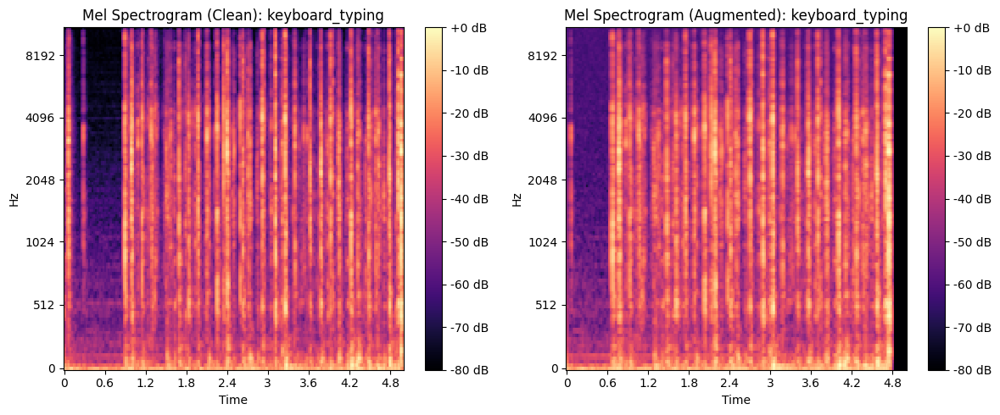


Category (Interior/Domestic - Augmentation): keyboard_typing



In [ ]:
# --- Testing Interior/Domestic Augmentation ---
y_aug, test_path, test_label = test_augmentation(df_interior_domestic,8,augment_interior_domestic)
print(f'\nCategory (Interior/Domestic - Augmentation): {test_label}\n')
Audio(y_aug,rate=sr,autoplay=False)

### Urban

In [ ]:
def augment_urban(y, sr):
    """
    Urban/mechanical: Distance effects, urban background, minimal pitch
    - Cars/sirens at different distances
    - Urban noise pollution
    - Doppler effect for moving vehicles
    - Mechanical sounds have fixed pitch (engines don't change tone much)
    """
    y_aug = y.copy()

    # Strong volume variation (distance from source)
    if random.random() < 0.8:
        y_aug = change_volume(y_aug, factor=random.uniform(0.3, 1.5))

    # Urban background noise
    if random.random() < 0.7:
        y_aug = add_urban_ambience(y_aug)

    # Distance-based filtering (far away = muffled)
    if random.random() < 0.6:
        y_aug = add_distance_filter(y_aug, sr)

    # Time shift (vehicles pass at different times)
    if random.random() < 0.5:
        y_aug = time_shift(y_aug, scale=random.uniform(0.15, 0.3))

    # Minimal pitch shift (engines have fixed RPM)
    if random.random() < 0.3:
        n_steps = random.choice([-1, 0, 1])
        y_aug = librosa.effects.pitch_shift(y_aug, sr=sr, n_steps=n_steps)

    return y_aug


def add_urban_ambience(y):
    """Simulate urban environment"""
    # Traffic rumble + general noise
    ambience = np.random.randn(len(y)) * 0.005
    # Emphasize low frequencies (traffic)
    from scipy.signal import butter, filtfilt
    b, a = butter(2, 0.1, btype='low')
    ambience = filtfilt(b, a, ambience)
    return y + ambience * random.uniform(0.1, 0.25)

def add_distance_filter(y, sr):
    """Simulate distance by removing high frequencies"""

    # Far away = more high-frequency loss
    cutoff_freq = random.uniform(2000, 6000)  # Hz
    nyquist = sr / 2
    normalized_cutoff = cutoff_freq / nyquist

    b, a = butter(4, normalized_cutoff, btype='low')
    y_filtered = filtfilt(b, a, y)

    # Mix based on "distance"
    distance_factor = random.uniform(0.3, 0.8)
    return y * (1 - distance_factor) + y_filtered * distance_factor



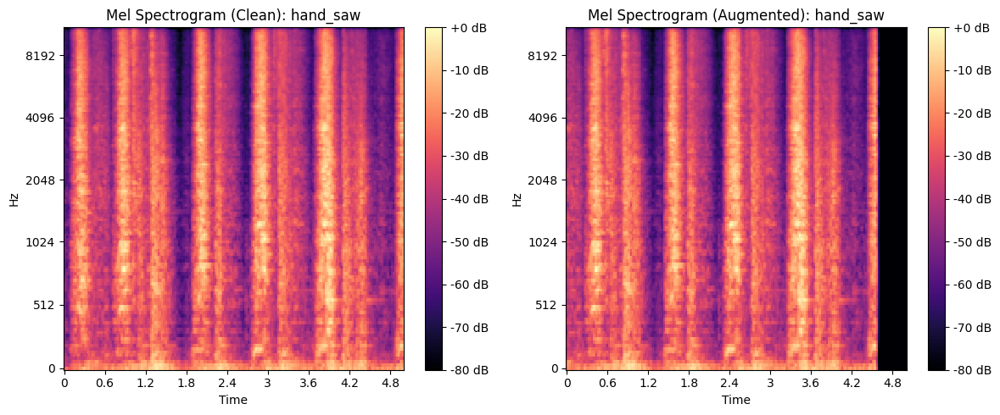


Category (Urban - Augmentation): hand_saw



In [ ]:
# --- Testing Urban Augmentation ---
y_aug, test_path, test_label = test_augmentation(df_urban,22,augment_urban)
print(f'\nCategory (Urban - Augmentation): {test_label}\n')
Audio(y_aug,rate=sr,autoplay=False)

### Apply Augmentations

In [ ]:
def Add_Augmentations_Acoustic(y, sr, category):
    """
    Apply context-aware augmentation based on acoustic category
    """
    acoustic_categories = {
        'animals': [
            'dog', 'rooster', 'pig', 'cow', 'frog', 'cat', 'hen',
            'insects', 'sheep', 'crow'
        ],
        'natural_soundscapes': [
            'rain', 'sea_waves', 'crackling_fire', 'crickets', 'chirping_birds',
            'water_drops', 'wind', 'pouring_water', 'toilet_flush', 'thunderstorm'
        ],
        'human_non_speech': [
            'crying_baby', 'sneezing', 'clapping', 'breathing', 'coughing',
            'footsteps', 'laughing', 'brushing_teeth', 'snoring', 'drinking_sipping'
        ],
        'interior_domestic': [
            'door_wood_knock', 'mouse_click', 'keyboard_typing', 'door_wood_creaks',
            'can_opening', 'washing_machine', 'vacuum_cleaner', 'clock_alarm',
            'clock_tick', 'glass_breaking'
        ],
        'urban_mechanical': [
            'helicopter', 'chainsaw', 'siren', 'car_horn', 'engine', 'train',
            'church_bells', 'airplane', 'fireworks', 'hand_saw'
        ]
    }
    if category in acoustic_categories['animals']:
        return augment_animals(y, sr)

    elif category in acoustic_categories['natural_soundscapes']:
        return augment_natural_soundscapes(y, sr)

    elif category in acoustic_categories['human_non_speech']:
        return augment_human_non_speech(y, sr)

    elif category in acoustic_categories['interior_domestic']:
        return augment_interior_domestic(y, sr)

    elif category in acoustic_categories['urban_mechanical']:
        return augment_urban(y, sr)

    else:
        # Fallback: generic augmentation
        return Add_Augmentations_Balanced(y, sr)

In [ ]:
# --- Create the train dataframe using the recipe style augmentation --=
path_to_audio='ESC-50/audio/'

df = pd.read_csv("ESC-50/meta/esc50.csv")
df_aug = df.copy()
df_aug = df_aug.drop(['esc10','src_file','take'], axis=1)
df_aug = df_aug[df_aug['fold'].isin([1,2,3])]
df_aug['filename'] = df_aug['filename'].apply(lambda x: os.path.join(path_to_audio, x))  # prepend audio folder


train_df_acoustic = create_augmented_data(augmentation_method=Add_Augmentations_Acoustic,
    n_samples_generated=5,
    augmentation_name='acoustic_augmentation',
    df = df_aug,
    df_save_path='data/train_df_acoustic.csv')

Processed 100 files
Processed 200 files
Processed 300 files
Processed 400 files
Processed 500 files
Processed 600 files
Processed 700 files
Processed 800 files
Processed 900 files
Processed 1000 files
Processed 1100 files
Processed 1200 files


In [ ]:
# --- Acosutic Augmentations Spectrograms ---

### RUN ONLY ONCE WHEN DOWNLOADED

train_df_acoustic = pd.read_csv('data/train_df_acoustic.csv')
out_dir_train = "precomputed_spectrograms/acoustic_based_spectrograms_train/"

precompute_spectrograms(audio_paths = train_df_acoustic['filename'].tolist(),
  transform = train_transform,
  out_dir = out_dir_train
)

Computed 0 spectrograms
Computed 100 spectrograms
Computed 200 spectrograms
Computed 300 spectrograms
Computed 400 spectrograms
Computed 500 spectrograms
Computed 600 spectrograms
Computed 700 spectrograms
Computed 800 spectrograms
Computed 900 spectrograms
Computed 1000 spectrograms
Computed 1100 spectrograms
Computed 1200 spectrograms
Computed 1300 spectrograms
Computed 1400 spectrograms
Computed 1500 spectrograms
Computed 1600 spectrograms
Computed 1700 spectrograms
Computed 1800 spectrograms
Computed 1900 spectrograms
Computed 2000 spectrograms
Computed 2100 spectrograms
Computed 2200 spectrograms
Computed 2300 spectrograms
Computed 2400 spectrograms
Computed 2500 spectrograms
Computed 2600 spectrograms
Computed 2700 spectrograms
Computed 2800 spectrograms
Computed 2900 spectrograms
Computed 3000 spectrograms
Computed 3100 spectrograms
Computed 3200 spectrograms
Computed 3300 spectrograms
Computed 3400 spectrograms
Computed 3500 spectrograms
Computed 3600 spectrograms
Computed 3700

torch.Size([1, 128, 216])


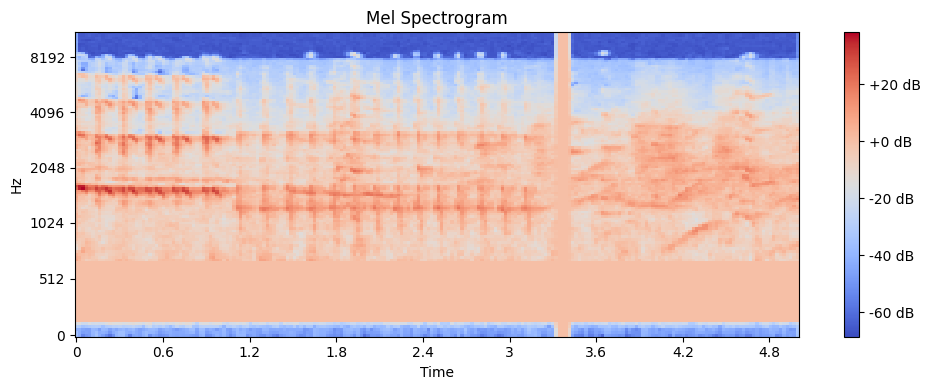

In [ ]:
# Load tensor
mel_spectrogram = torch.load('precomputed_spectrograms/acoustic_based_spectrograms_train/000001.pt')
print(mel_spectrogram.shape)
mel_spectrogram = mel_spectrogram.squeeze(0)

# Convert to NumPy
mel_spectrogram = mel_spectrogram.numpy()

# Plot
plt.figure(figsize=(10, 4))
librosa.display.specshow(mel_spectrogram, x_axis='time', y_axis='mel', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.title('Mel Spectrogram')
plt.tight_layout()
plt.show()

In [ ]:
import glob
import os
import pandas as pd

# --- Load CSVs ---
df = pd.read_csv('ESC-50/meta/esc50.csv')
train_df_acoustic = pd.read_csv('data/train_df_acoustic.csv')
# --- Define folds for validation and test ---
val_fold = 4
test_fold = 5

validation_df = df[df['fold'] == val_fold]
test_df = df[df['fold'] == test_fold]

# --- Extract labels ---
acoustic_labels = train_df_acoustic['target'].tolist()
val_labels = validation_df['target'].tolist()
test_labels = test_df['target'].tolist()

# --- Precomputed spectrogram directories ---
acoustic_spectrogram_path = 'precomputed_spectrograms/acoustic_based_spectrograms_train/'
val_spectrogram_path = 'precomputed_spectrograms/spectrograms_validation/'
test_spectrogram_path = 'precomputed_spectrograms/spectrograms_test/'

# --- Helper function to get sorted .pt files ---
def get_pt_files(directory):
    return sorted(glob.glob(os.path.join(directory, '*.pt')))

# --- Load .pt file paths ---
train_paths_acoustic = get_pt_files(acoustic_spectrogram_path)
val_paths = get_pt_files(val_spectrogram_path)
test_paths = get_pt_files(test_spectrogram_path)

# --- Sanity check: lengths match ---
assert len(train_paths_acoustic) == len(acoustic_labels), "Acoustic train mismatch!"
assert len(val_paths) == len(val_labels), "Validation mismatch!"
assert len(test_paths) == len(test_labels), "Test mismatch!"

# --- Initialize datasets ---
train_data_acoustic = ESC50_Dataset(acoustic_labels,train_paths_acoustic)
val_data = ESC50_Dataset(val_labels, val_paths)
test_data = ESC50_Dataset(test_labels, test_paths)

# --- Print dataset sizes ---
print(f'Train Samples (Acoustic): {len(train_data_acoustic)}')
print(f'Validation Samples: {len(val_data)}')
print(f'Test Samples: {len(test_data)}')


Train Samples (Acoustic): 7200
Validation Samples: 400
Test Samples: 400


In [ ]:
train_loader_acoustic = DataLoader(
    dataset=train_data_acoustic,
    shuffle=True,
    batch_size=batch_size,
    num_workers=0
)

In [ ]:
train_loader_acoustic = DataLoader(train_data_acoustic, batch_size=32, shuffle=True, num_workers=0)
val_loader = DataLoader(val_data, batch_size=32, num_workers=0)
test_loader = DataLoader(test_data, batch_size=32, num_workers=0)


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 1/50: Train Loss=3.2435, Train Acc=16.33% | Val Loss=3.4836, Val Acc=21.75%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 2/50: Train Loss=2.4283, Train Acc=34.94% | Val Loss=2.6072, Val Acc=36.00%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 3/50: Train Loss=2.1000, Train Acc=44.75% | Val Loss=3.8149, Val Acc=29.50%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 4/50: Train Loss=1.8886, Train Acc=51.00% | Val Loss=2.5431, Val Acc=37.25%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 5/50: Train Loss=1.7015, Train Acc=58.24% | Val Loss=1.9116, Val Acc=50.75%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 6/50: Train Loss=1.5237, Train Acc=64.35% | Val Loss=2.1505, Val Acc=43.50%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 7/50: Train Loss=1.4610, Train Acc=66.19% | Val Loss=2.0415, Val Acc=48.75%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 8/50: Train Loss=1.3700, Train Acc=70.15% | Val Loss=1.9404, Val Acc=54.75%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 9/50: Train Loss=1.3021, Train Acc=72.25% | Val Loss=2.2010, Val Acc=51.00%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 10/50: Train Loss=1.2261, Train Acc=75.74% | Val Loss=2.0087, Val Acc=55.00%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 11/50: Train Loss=1.1516, Train Acc=77.96% | Val Loss=1.6491, Val Acc=56.25%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 12/50: Train Loss=1.0601, Train Acc=80.92% | Val Loss=1.7594, Val Acc=58.25%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 13/50: Train Loss=1.0554, Train Acc=82.08% | Val Loss=1.6250, Val Acc=64.50%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 14/50: Train Loss=0.9598, Train Acc=84.90% | Val Loss=1.8566, Val Acc=56.75%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 15/50: Train Loss=0.9136, Train Acc=86.85% | Val Loss=1.8965, Val Acc=52.75%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 16/50: Train Loss=0.8761, Train Acc=87.99% | Val Loss=1.7572, Val Acc=61.50%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 17/50: Train Loss=0.8377, Train Acc=89.67% | Val Loss=1.5981, Val Acc=66.75%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 18/50: Train Loss=0.8227, Train Acc=90.01% | Val Loss=2.0490, Val Acc=57.25%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 19/50: Train Loss=0.7751, Train Acc=91.83% | Val Loss=1.6831, Val Acc=63.50%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 20/50: Train Loss=0.7426, Train Acc=92.81% | Val Loss=1.6996, Val Acc=66.00%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 21/50: Train Loss=0.7095, Train Acc=93.93% | Val Loss=1.8154, Val Acc=59.75%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 22/50: Train Loss=0.7298, Train Acc=93.57% | Val Loss=1.4521, Val Acc=72.25%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 23/50: Train Loss=0.6673, Train Acc=95.32% | Val Loss=1.3057, Val Acc=74.75%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 24/50: Train Loss=0.6471, Train Acc=95.99% | Val Loss=1.4272, Val Acc=72.75%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 25/50: Train Loss=0.6544, Train Acc=95.67% | Val Loss=1.5951, Val Acc=65.00%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 26/50: Train Loss=0.6460, Train Acc=95.85% | Val Loss=1.5465, Val Acc=69.00%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 27/50: Train Loss=0.6215, Train Acc=96.42% | Val Loss=1.3663, Val Acc=72.25%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 28/50: Train Loss=0.5635, Train Acc=98.39% | Val Loss=1.4030, Val Acc=72.50%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 29/50: Train Loss=0.5815, Train Acc=97.89% | Val Loss=1.4967, Val Acc=68.75%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 30/50: Train Loss=0.5807, Train Acc=97.71% | Val Loss=1.4424, Val Acc=69.50%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 31/50: Train Loss=0.5489, Train Acc=98.78% | Val Loss=1.3380, Val Acc=73.75%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 32/50: Train Loss=0.5337, Train Acc=98.89% | Val Loss=1.3613, Val Acc=74.50%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 33/50: Train Loss=0.5128, Train Acc=99.25% | Val Loss=1.3752, Val Acc=73.75%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 34/50: Train Loss=0.5154, Train Acc=99.44% | Val Loss=1.3181, Val Acc=75.25%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 35/50: Train Loss=0.4925, Train Acc=99.71% | Val Loss=1.2582, Val Acc=76.25%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 36/50: Train Loss=0.4856, Train Acc=99.78% | Val Loss=1.3210, Val Acc=73.75%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 37/50: Train Loss=0.4888, Train Acc=99.50% | Val Loss=1.2504, Val Acc=73.25%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 38/50: Train Loss=0.4763, Train Acc=99.71% | Val Loss=1.3324, Val Acc=73.25%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 39/50: Train Loss=0.4690, Train Acc=99.85% | Val Loss=1.2213, Val Acc=77.50%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 40/50: Train Loss=0.4605, Train Acc=99.93% | Val Loss=1.2437, Val Acc=77.00%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 41/50: Train Loss=0.4534, Train Acc=99.94% | Val Loss=1.2610, Val Acc=76.75%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 42/50: Train Loss=0.4482, Train Acc=100.00% | Val Loss=1.2591, Val Acc=76.25%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 43/50: Train Loss=0.4429, Train Acc=100.00% | Val Loss=1.2446, Val Acc=76.50%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 44/50: Train Loss=0.4402, Train Acc=100.00% | Val Loss=1.2378, Val Acc=77.50%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 45/50: Train Loss=0.4377, Train Acc=100.00% | Val Loss=1.2174, Val Acc=76.50%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 46/50: Train Loss=0.4355, Train Acc=100.00% | Val Loss=1.2082, Val Acc=79.50%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 47/50: Train Loss=0.4336, Train Acc=100.00% | Val Loss=1.1881, Val Acc=78.50%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 48/50: Train Loss=0.4323, Train Acc=100.00% | Val Loss=1.2302, Val Acc=78.00%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 49/50: Train Loss=0.4320, Train Acc=100.00% | Val Loss=1.2243, Val Acc=77.00%


Training:   0%|          | 0/225 [00:00<?, ?it/s]

Validation:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch 50/50: Train Loss=0.4313, Train Acc=100.00% | Val Loss=1.1989, Val Acc=79.00%


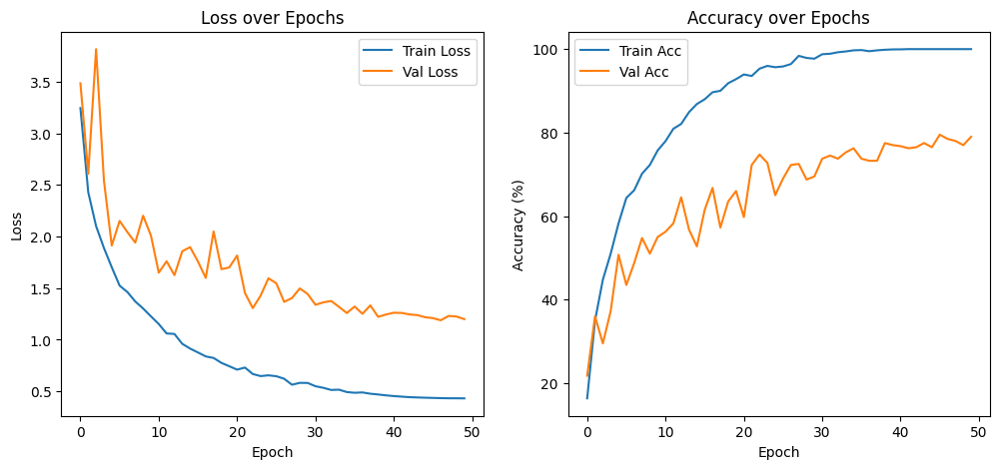

In [ ]:
# --- Acoustic Model Training ---

resNet_acoustic = ResNet34().to(device)

train_logger_acoustic, validation_logger_acoustic, train_acc_logger_acoustic, validation_acc_logger_acoustic = train_model(resNet_acoustic, train_loader_acoustic, validation_loader)

plot_training(train_logger_acoustic, validation_logger_acoustic, train_acc_logger_acoustic, validation_acc_logger_acoustic)


In [ ]:
criterion = nn.CrossEntropyLoss(label_smoothing=0.05)
test_acc,loss = evaluate(resNet_acoustic,criterion,device,test_loader)
print(f'Test Accuracy: {test_acc}%')

Evaluating:   0%|          | 0/13 [00:00<?, ?it/s]

Test Accuracy: 70.0%


In [ ]:
torch.save(resNet_acoustic.state_dict(), "data/ResNet34_acoustic_augmentation.pth")

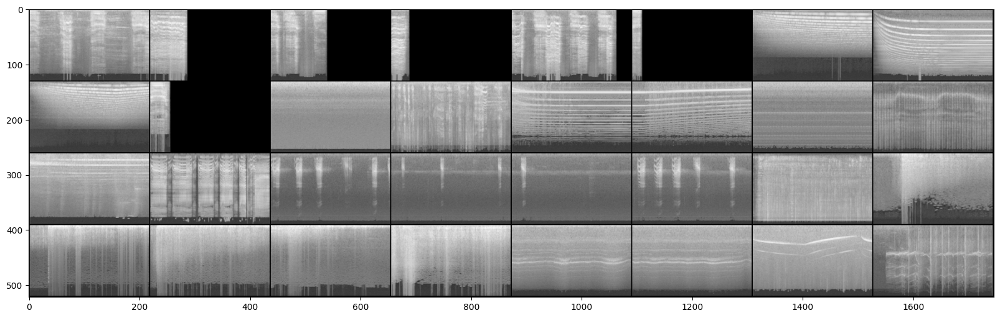

In [ ]:
dataiter = iter(test_loader)
test_imgs,test_labels = next(dataiter)

# --- Visualizing One Batch ---
plt.figure(figsize = (20,10))
out = torchvision.utils.make_grid(test_imgs, 8, normalize=True)
plt.imshow(out.numpy().transpose((1, 2, 0)))


In [ ]:
all_preds = []
all_labels = []

resNet_acoustic.eval()
with torch.no_grad():
    for imgs, labels in test_loader:
        imgs = imgs.to(device)
        labels = labels.to(device)

        outputs = resNet_acoustic(imgs)
        preds = outputs.argmax(dim=1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

print(classification_report(all_labels,all_preds))

              precision    recall  f1-score   support

           0       0.62      0.62      0.62         8
           1       0.89      1.00      0.94         8
           2       0.50      0.38      0.43         8
           3       0.67      1.00      0.80         8
           4       0.86      0.75      0.80         8
           5       0.71      0.62      0.67         8
           6       0.83      0.62      0.71         8
           7       0.78      0.88      0.82         8
           8       1.00      1.00      1.00         8
           9       0.88      0.88      0.88         8
          10       0.86      0.75      0.80         8
          11       0.89      1.00      0.94         8
          12       0.50      0.25      0.33         8
          13       0.78      0.88      0.82         8
          14       0.86      0.75      0.80         8
          15       0.75      0.38      0.50         8
          16       0.80      0.50      0.62         8
          17       0.75    

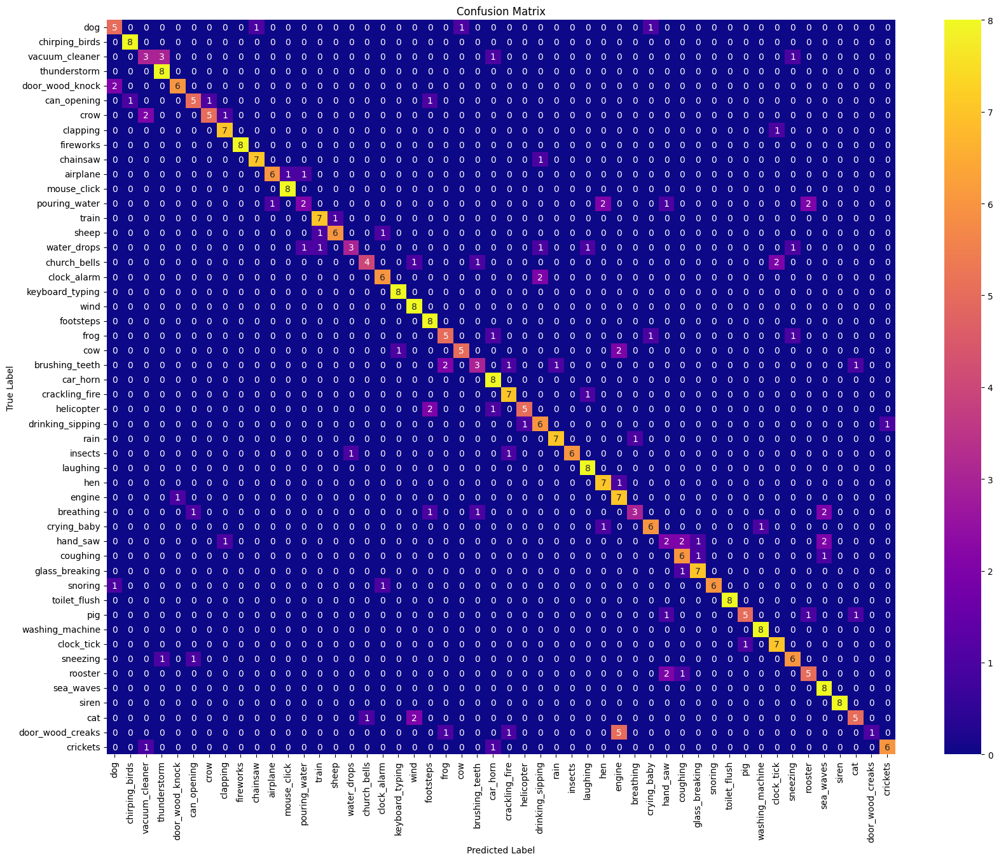

In [ ]:
# --- Plot Confusion Matrix ---
cm = confusion_matrix(all_labels, all_preds)
classes = df['category'].unique()
plt.figure(figsize=(20,15))
sns.heatmap(cm, annot=True, fmt='d', cmap='plasma',xticklabels=classes,yticklabels=classes)
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Confusion Matrix')
plt.show()

## Acoustic Augmentations Conclusions

So despite all that effort, the model was still not able to adequately distinguish the classes it struggled with

As far as my attempts go this is it :(

Despite extensive experimentation with acoustic-based augmentations, the model was ultimately unable to reliably distinguish several of the more challenging ESC-50 classes. While certain classes benefited from the added variability, the overall impact of these augmentations was limited. Persistent confusion remained among acoustically similar categories, indicating that simply increasing intra-class diversity through handcrafted acoustic transformations was not sufficient to resolve the model’s weaknesses.

The classification report highlights this imbalance clearly. Some classes achieved near-perfect precision and recall, while others exhibited very low recall and F1-scores, suggesting that the model continued to collapse predictions toward more dominant or acoustically salient patterns. This uneven performance indicates that the augmentation strategy amplified existing biases rather than encouraging more discriminative feature learning across all classes.

This experiment represents the practical limit of my custom acoustic augmentation approach. While conceptually sound, augmenting strictly based on acoustic class groupings did not consistently translate into improved generalization. In contrast, proven ESC-50 augmentation strategies—such as balanced or class-aware augmentation pipelines—demonstrate more stable performance across classes, achieving an overall accuracy of 75% with significantly reduced variance in class-level metrics.

In conclusion, these results suggest that augmentation design is more critical than augmentation quantity. Effective ESC-50 performance appears to rely on carefully balanced, empirically validated strategies rather than purely intuitive acoustic transformations. Future improvements would likely require either stronger feature representations, more expressive models, or augmentation policies that explicitly target class imbalance and inter-class confusion rather than acoustic similarity alone.
